# Hlasování

<b>Zdroj dat: https://www.psp.cz/eknih/cdrom/opendata/</b>

Formát dat
Data jsou dostupná ve formátu UNL, tj. každý řádek v souboru odpovídá jednomu řádku v databázi, oddělovačem je znak roury (|), pokud je sloupec prázdný, je jeho hodnota typu null. V sloupcích jsou používány tzv. escape sekvence k zápisu speciálních znaků s úvodním znakem \ (backslash) následovaný znakem.

Kódování je windows-1250.

Pokud bude strunktura dat doplňována, budou nové sloupce přidávány na konec.

Data jsou poskytována bezplatně, využití dat je <b>podmíněno uvedením zdroje dat a případně datem zpracování dat</b>.


<b>Jmenné konvence:</b>
* tabulky a sloupce tabulek česky dle konvence v zdrojových datech
* proměnné, které se semanticky vztahují k dění v poslanecké sněmovně, česky bez diakritiky nebo anglicky
* ostatní proměnné anglicky
* komentáře a vysvětlení česky s diakritikou
* funkce anglicky

# Parametry

In [1]:
volebni_obdobi = '2017'

hlasovani_dir = f"./data/hlasovani-{volebni_obdobi}ps/"
poslanci_dir = "./data/poslanci/"
stenozaznamy_dir = "./data/steno/"
schuze_dir = "./data/schuze/"

# Instalace závislostí

In [2]:
!pip install jupyter-dash -q

You should consider upgrading via the '/home/borjana/.venv/finance/bin/python3.7 -m pip install --upgrade pip' command.


# Importy

In [3]:
import logging
log = logging.getLogger(__name__)
log.setLevel(level=logging.DEBUG)
log.debug("ahoj")

In [4]:
import requests
from pathlib import Path
import zipfile
from os import listdir, path

from datetime import timezone, datetime
import pytz

import pandas as pd
import numpy as np

import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff

import dash
from jupyter_dash import JupyterDash
import dash_core_components as dcc
import dash_html_components as html
from dash.dependencies import Input, Output

# Funkce
bude je třeba přesunout do samostatného souboru

In [5]:
def download_and_unzip(url, zip_file_name, data_dir):
    print(f"\nVytvářím adresář: '{data_dir}'")
    Path(data_dir).mkdir(parents=True, exist_ok=True)
        
    print(f"Stahuji data z: '{url}'")
    r = requests.get(url)
    with open(zip_file_name, 'wb') as f:
        f.write(r.content)
    print(f"Status: {r.status_code}, headers: {r.headers['content-type']}, encoding: {r.encoding}")

    print(f"Rozbaluji data do: '{data_dir}'")
    with zipfile.ZipFile(zip_file_name, 'r') as zip_ref:
        zip_ref.extractall(data_dir)
    print(f"Soubory v adresáři: {listdir(data_dir)}")

In [6]:
# pandas utility

def popis_tabulku(df):
    """
    Popiš vlastnosti tabulky
    """
    print(f"Počet řádků v tabulce: {df.index.size}")
    print()
    print("Počet unikátních hodnot pro každý sloupec:")
    ret = df.nunique().sort_values(ascending=False)
    print(df.nunique().sort_values(ascending=False))
    print()
    
    sloupce_s_jedinou_hodnotou = ret[ret == 1]
    if len(sloupce_s_jedinou_hodnotou) == 0:
        print("Každý sloupec obsahuje alespoň dvě hodnoty.")
    else:
        print("Sloupce s jedinou hodnotou:")
        ret = "\n".join([f"  '{column}' má všude hodnotu '{df[column].iloc[0]}'" for (column, cnt) in sloupce_s_jedinou_hodnotou.iteritems()])
        print(ret)
    
def popis_nulove_hodnoty(df):
    """
    Vypiš jména sloupců s NaNy a odpovídající četnost NaNů
    """
    nans_df = df[df.columns[df.isna().any()]]
    col_with_nans = nans_df.columns

    if len(col_with_nans) == 0:
        print("Tabulka neobsahuje žádné nulové hodnoty.")
        return
    
    for col in col_with_nans:
        cnt = len(df[df[col].isna() == True])
        print(f"Sloupec '{col}' obsahuje {100*cnt/len(df):.2f}% ({cnt} z {len(df)}) NaNů.")
    
def popis_sloupec(df, column):
    #print(df[column].describe())
    print(f"Typ: {df[column].dtype}")
    print(f"Počet hodnot: {df[column].count()}")
    print(f"Počet unikátních hodnot: {df[column].nunique()} ({100*df[column].nunique()/df[column].count():.2f}%)")
    print(f"První hodnota: {df.iloc[0][column]}")
    print(f"Poslední hodnota: {df.iloc[-1][column]}")

def cetnost_opakovani_dle_sloupce(df, column, printout=False):
    """
    Cetnost radku dle sloupce
    """
    tmp_column = f"{column}_cnt"
    ret = df.groupby(column).agg('size').reset_index(name=tmp_column).groupby(tmp_column).size()

    if printout:
        freq_str = "\n".join([f"{cnt} hodnot se opakuje {freq} krát" for (freq, cnt) in ret.iteritems()])
        print(f"Četnost opakování '{column}' vzestupně:\n{freq_str}")
    return ret

In [7]:
def strip_all_string_columns(df):
    """
    Trim whitespace from ends of each value across all series in dataframe
    """
    strip_strings = lambda x: x.strip() if isinstance(x, str) else x
    return df.applymap(strip_strings)

def mask_by_values(series, mask):
    """
    Masks the values of a series according to adictionary
    """
    if True: #(series.dtype == pd.Int64Dtype()):
        series = series.astype(object) 

    new_series = series.copy()

    for val_to_mask in series.unique():
        if val_to_mask in mask.keys(): # mask it
            new_series = new_series.mask(series == val_to_mask, mask[val_to_mask])    
        #else:
        #    new_column = new_column.mask(df[column] == val_to_mask, f"{val_to_mask}{unmasked_suffix}")    
    return new_series

def drop_by_inconsistency (df, suffix, threshold):
    inc = {}
    
    for col in df.columns[df.columns.str.endswith(suffix)]:
        short_col = col[:len(col)-len(suffix)]
        difference = df[df[short_col] != df[col]]
        print(f"'{short_col}' and '{col}' differ in {len (difference)} columns from {len(df)}")
        inc[short_col] = float(len(difference))/len(df)
        
    to_drop = [col for (col, inconsistency) in inc.items() if inconsistency >= threshold]
    to_skip = [col + suffix for col in inc.keys()]
    print(f"Dropping {to_drop} because of big inconsistencies.")
    df.drop(labels=to_drop, inplace=True, axis=1)
    print(f"Dropping {to_skip} because of abundance.")
    df.drop(labels=to_skip, inplace=True, axis=1)

    return df

In [8]:
df = pd.DataFrame({"alpha": ["a", "a", "b", "c"], "num": [1,3,4,1]})
df.num = df.num.astype('Int64') #.dtypes = 'int'

In [9]:
#df.alpha.dtype == pd.Int64Dtype()

In [10]:
mask = {"a": 1}
mask_by_values(df.alpha, mask)

0    1
1    1
2    b
3    c
Name: alpha, dtype: object

In [11]:
mask = {1: "a"}
mask_by_values(df.num, mask)

0    a
1    3
2    4
3    a
Name: num, dtype: object

In [12]:
def groupby_bar(df, by, xlabel=None, ylabel=None, title=''):
    xlabel = by if xlabel == None else xlabel
    ylabel = '' if ylabel == None else ylabel
        
    groups = df.groupby(by).size()
    fig = go.Figure(go.Bar(
        x=groups.index,
        y=groups.values,
        hovertemplate=
            xlabel + ": %{x}<br>" +
            ylabel + ": %{y:.0}<br>" +
            "<extra></extra>"
    ))
    
    fig.update_xaxes(title_text=xlabel, type="category")
    fig.update_yaxes(title_text=ylabel)
    fig.update_layout(title=title, width=600, height=400)
    return fig

# Stažení dat

In [13]:
import os
from urllib.parse import urlparse

class Snemovna:        
    def __init__(self, data_dir='.'):
        print("--> Snemovna")        
        self.data_dir = data_dir
        self.url=None
        self.zip=None
        
        self.paths = {}
        print("<-- Snemovna")
        
    def missing_files(self):
        missing_files = []
        paths_flat = sum([item if isinstance(item, list) else [item] for item in self.paths.values()], [])
        print(f"Checking for: {paths_flat}")
        for p in paths_flat:
            if path.isfile(p) is not True:
                missing_files.append(p)
        print(f"Missing files: {missing_files}")
        return missing_files

    def nastav_datovy_zdroj(self, url):
        a = urlparse(url)
        self.file_name = os.path.basename(a.path)  
        self.url = url #f"https://www.psp.cz/eknih/cdrom/opendata/{self.file_name}"
        self.zip = f"{self.data_dir}/{self.file_name}"
        print(self.zip)
        
    def stahni(self):
        if (self.url is not None) and (self.zip is not None) and (self.data_dir is not None):
            download_and_unzip(self.url, self.zip, self.data_dir)
        else:
            print("Error: download paths not set!")
            
    def pretipuj(self, df, header, name=None):
        if name is not None:
            print(f"Tabulka {name}:")
        new_df = pd.DataFrame()
        for col in df.columns:
            if col in header:
                print(f"Přetypovávám sloupec: '{col}'.")
                new_df[col] = df[col].astype(header[col])
        return new_df

In [14]:
class TypOrganu(Snemovna):
    def __init__(self, data_dir=".", stahni=False):
        print("--> TypOrganu")
        super(TypOrganu, self).__init__(data_dir=data_dir)
        
        self.nastav_datovy_zdroj("https://www.psp.cz/eknih/cdrom/opendata/poslanci.zip")

        # Organy - cesty k tabulkám, viz. https://www.psp.cz/sqw/hp.sqw?k=1301
        # Orgány mají svůj typ, tyto typy mají hiearchickou strukturu.
        self.paths['typ_organu'] = f"{data_dir}/typ_organu.unl"

        if len(self.missing_files()) > 0 or stahni:
            self.stahni()
        
        self.typ_organu, self._typ_organu = self.nacti_typ_organu()
        
        self.df = self.typ_organu
        
        print("<-- TypOrganu")

    def nacti_typ_organu(self):
        header = {
            # Identifikátor typu orgánu
            'id_typ_org': 'Int64',
            # Identifikátor nadřazeného typu orgánu (typ_organu:id_typ_org), pokud je null či nevyplněno, pak nemá nadřazený typ
            'typ_id_typ_org': 'Int64',
            # Název typu orgánu v češtině
            'nazev_typ_org_cz': 'string',
            # Název typu orgánu v angličtině
            'nazev_typ_org_en': 'string',
            # Obecný typ orgánu, pokud je vyplněný, odpovídá záznamu v typ_organu:id_typ_org. Pomocí tohoto sloupce lze najít např. všechny výbory v různých typech zastupitelských sborů.
            'typ_org_obecny': 'Int64',
            # Priorita při výpisu
            'priorita': 'Int64'
        }
        
        _df = pd.read_csv(self.paths['typ_organu'], sep="|", names = header.keys(), index_col=False, encoding='cp1250')
        df = self.pretipuj(_df, header, name='typ_organu')
        
        # Oveř, že id_typ_org lze použít jako index
        # Unikátnost identifikátoru hlasování je jednou z nutných podmínek konzistence dat
        #assert df.index.size == df.id_typ_org.nunique()
        #df = df.set_index('id_typ_org')
        
        return df, _df

In [15]:
to = TypOrganu(data_dir="data5/")
to.df.head()
to.df.columns

--> TypOrganu
--> Snemovna
<-- Snemovna
data5//poslanci.zip
Checking for: ['data5//typ_organu.unl']
Missing files: []
Tabulka typ_organu:
Přetypovávám sloupec: 'id_typ_org'.
Přetypovávám sloupec: 'typ_id_typ_org'.
Přetypovávám sloupec: 'nazev_typ_org_cz'.
Přetypovávám sloupec: 'nazev_typ_org_en'.
Přetypovávám sloupec: 'typ_org_obecny'.
Přetypovávám sloupec: 'priorita'.
<-- TypOrganu


Index(['id_typ_org', 'typ_id_typ_org', 'nazev_typ_org_cz', 'nazev_typ_org_en',
       'typ_org_obecny', 'priorita'],
      dtype='object')

In [16]:
class Organy(TypOrganu):
    def __init__(self, data_dir='.', stahni=False):
        print("--> Organy")
        super(Organy, self).__init__(data_dir=data_dir, stahni=stahni)
        
        self.nastav_datovy_zdroj("https://www.psp.cz/eknih/cdrom/opendata/poslanci.zip")

        # Cesty k tabulkám, viz. https://www.psp.cz/sqw/hp.sqw?k=1301
        #Záznam mezi orgánem a typem funkce, názvy v funkce:nazev_funkce_LL se používají pouze interně,
        # slouží k definování pořadí funkcionářů v případech, kdy je toto pořadí určeno.
        self.paths['funkce'] = f"{data_dir}/funkce.unl"
        # Některé orgány mají nadřazený orgán a pak je položka organy:organ_id_organ vyplněna,
        # přičemž pouze v některých případech se tyto vazby využívají.
        self.paths['organy'] = f"{data_dir}/organy.unl"

        if len(self.missing_files()) > 0 or stahni:
            self.stahni()
        
        self.organy, self._organy = self.nacti_organy()
        
        # Připoj Typu orgánu
        suffix = "__typ_organu"
        self.organy = pd.merge(left=self.organy, right=self.typ_organu, left_on="id_typ_organu", right_on="id_typ_org", suffixes=("",suffix), how='left')
        self.organy = drop_by_inconsistency(self.organy, suffix, 0.1)
      
        self.df = self.organy

        print("<-- Organy")
   
    def nacti_organy(self):
        header = {
            # Identifikátor orgánu
            "id_organ": 'Int64',
            # Identifikátor nadřazeného orgánu, viz organy:id_organ
            "organ_id_organ": 'Int64',
            # Typ orgánu, viz typ_organu:id_typ_organu
            "id_typ_organu": 'Int64',
            # Zkratka orgánu, bez diakritiky, v některých připadech se zkratka při zobrazení nahrazuje jiným názvem
            "zkratka": 'string',
            # Název orgánu v češtině
            "nazev_organu_cz": "string",
            # Název orgánu v angličtině
            "nazev_organu_en": "string",
            # Ustavení orgánu
            "od_organ":  'datetime64[ns]',
            # Ukončení orgánu
            "do_organ":  'datetime64[ns]',
            # Priorita výpisu orgánů
            "priorita":  'Int64',
            # Pokud je nastaveno na 1, pak při výpisu členů se nezobrazují záznamy v tabulkce zarazeni kde cl_funkce == 0.
            # Toto chování odpovídá tomu, že v některých orgánech nejsou členové a teprve z nich se volí funkcionáři, ale přímo se volí do určité funkce.
            "cl_organ_base": 'Int64' 
        }

        _df = pd.read_csv(self.paths['organy'], sep="|", names = header.keys(), index_col=False, encoding='cp1250')
        df = self.pretipuj(_df, header, name='organy')
         
        return df, _df

In [17]:
o = Organy(data_dir="data3/")
o.df.head()
sorted(o.df.columns)

--> Organy
--> TypOrganu
--> Snemovna
<-- Snemovna
data3//poslanci.zip
Checking for: ['data3//typ_organu.unl']
Missing files: []
Tabulka typ_organu:
Přetypovávám sloupec: 'id_typ_org'.
Přetypovávám sloupec: 'typ_id_typ_org'.
Přetypovávám sloupec: 'nazev_typ_org_cz'.
Přetypovávám sloupec: 'nazev_typ_org_en'.
Přetypovávám sloupec: 'typ_org_obecny'.
Přetypovávám sloupec: 'priorita'.
<-- TypOrganu
data3//poslanci.zip
Checking for: ['data3//typ_organu.unl', 'data3//funkce.unl', 'data3//organy.unl']
Missing files: []
Tabulka organy:
Přetypovávám sloupec: 'id_organ'.
Přetypovávám sloupec: 'organ_id_organ'.
Přetypovávám sloupec: 'id_typ_organu'.
Přetypovávám sloupec: 'zkratka'.
Přetypovávám sloupec: 'nazev_organu_cz'.
Přetypovávám sloupec: 'nazev_organu_en'.
Přetypovávám sloupec: 'od_organ'.
Přetypovávám sloupec: 'do_organ'.
Přetypovávám sloupec: 'priorita'.
Přetypovávám sloupec: 'cl_organ_base'.
'priorita' and 'priorita__typ_organu' differ in 265 columns from 1409
Dropping ['priorita'] becaus

['cl_organ_base',
 'do_organ',
 'id_organ',
 'id_typ_org',
 'id_typ_organu',
 'nazev_organu_cz',
 'nazev_organu_en',
 'nazev_typ_org_cz',
 'nazev_typ_org_en',
 'od_organ',
 'organ_id_organ',
 'typ_id_typ_org',
 'typ_org_obecny',
 'zkratka']

In [18]:
class TypFunkce(TypOrganu):
    def __init__(self, data_dir=".", stahni=False):
        print("--> TypFunkce")
        super(TypFunkce, self).__init__(data_dir=data_dir, stahni=False)
        
        self.nastav_datovy_zdroj("https://www.psp.cz/eknih/cdrom/opendata/poslanci.zip")

        # Organy - cesty k tabulkám, viz. https://www.psp.cz/sqw/hp.sqw?k=1301
        # Orgány mají svůj typ, tyto typy mají hiearchickou strukturu.
        self.paths['typ_funkce'] = f"{data_dir}/typ_funkce.unl"
        print(self.paths)
        if len(self.missing_files()) > 0 or stahni:
            self.stahni()
        
        self.typ_funkce, self._typ_funkce = self.nacti_typ_funkce()
        
        semanticka_maska = {1: "předseda", 2: "místopředseda", 3: "ověřovatel"}
        self.typ_funkce['typ_funkce_obecny_CAT'] = mask_by_values(self.typ_funkce.typ_funkce_obecny, semanticka_maska)
        
        #print(f"Odstraňuji sloupce: {set(self.typ_funkce.columns).intersection(self.typ_organu.columns)}")
        #labels = ["priorita"]
        #self.typ_funkce.drop(labels=labels, inplace=True, axis=1)
        # Připoj Typu orgánu
        suffix="__typ_organu"
        self.typ_funkce = pd.merge(left=self.typ_funkce, right=self.typ_organu, on="id_typ_org", suffixes=("", suffix), how='left')
        self.typ_funkce = drop_by_inconsistency(self.typ_funkce, suffix, 0.1)
        
        #self.typ_funkce.drop(labels=labels, inplace=True, axis=1)

        self.df = self.typ_funkce
        print("<-- TypFunkce")

    def nacti_typ_funkce(self):
        header = {
            # Identifikator typu funkce
            'id_typ_funkce': 'Int64',
            # Identifikátor typu orgánu, viz typ_organu:id_typ_org
            'id_typ_org': 'Int64',
            # Název typu funkce v češtině
            'typ_funkce_cz': 'string',
            # Název typu funkce v angličtině
            'typ_funkce_en': 'string',
            # Priorita při výpisu
            'priorita': 'Int64',
            # Obecný typ funkce, 1 - předseda, 2 - místopředseda, 3 - ověřovatel, jiné hodnoty se nepoužívají.
            'typ_funkce_obecny': 'Int64',

        }
        
        _df = pd.read_csv(self.paths['typ_funkce'], sep="|", names = header.keys(), index_col=False, encoding='cp1250')
        df = self.pretipuj(_df, header, name='typ_funkce')
        
        # Oveř, že id_typ_org lze použít jako index
        # Unikátnost identifikátoru hlasování je jednou z nutných podmínek konzistence dat
        assert df.index.size == df.id_typ_funkce.nunique()
        df = df.set_index('id_typ_org')
        
        return df, _df

In [19]:
f = TypFunkce(data_dir="data2/")
print(f.df.columns)
f.df.head()

--> TypFunkce
--> TypOrganu
--> Snemovna
<-- Snemovna
data2//poslanci.zip
Checking for: ['data2//typ_organu.unl']
Missing files: []
Tabulka typ_organu:
Přetypovávám sloupec: 'id_typ_org'.
Přetypovávám sloupec: 'typ_id_typ_org'.
Přetypovávám sloupec: 'nazev_typ_org_cz'.
Přetypovávám sloupec: 'nazev_typ_org_en'.
Přetypovávám sloupec: 'typ_org_obecny'.
Přetypovávám sloupec: 'priorita'.
<-- TypOrganu
data2//poslanci.zip
{'typ_organu': 'data2//typ_organu.unl', 'typ_funkce': 'data2//typ_funkce.unl'}
Checking for: ['data2//typ_organu.unl', 'data2//typ_funkce.unl']
Missing files: []
Tabulka typ_funkce:
Přetypovávám sloupec: 'id_typ_funkce'.
Přetypovávám sloupec: 'id_typ_org'.
Přetypovávám sloupec: 'typ_funkce_cz'.
Přetypovávám sloupec: 'typ_funkce_en'.
Přetypovávám sloupec: 'priorita'.
Přetypovávám sloupec: 'typ_funkce_obecny'.
'priorita' and 'priorita__typ_organu' differ in 129 columns from 129
Dropping ['priorita'] because of big inconsistencies.
Dropping ['priorita__typ_organu'] because of 

,id_typ_org,id_typ_funkce,typ_funkce_cz,typ_funkce_en,typ_funkce_obecny,typ_funkce_obecny_CAT,typ_id_typ_org,nazev_typ_org_cz,nazev_typ_org_en,typ_org_obecny
0,1,1,Místopředseda,Vice-chairman,2,místopředseda,11,Klub,Political Group,1
1,1,2,Předseda,Chairman,1,předseda,11,Klub,Political Group,1
2,2,4,Ověřovatel komise,Verifier of commission,3,ověřovatel,11,Komise,Commission,2
3,3,7,Ověřovatel výboru,Verifier of committee,3,ověřovatel,11,Výbor,Committee,3
4,3,9,Tajemník - ověřovatel výboru,Secretary - verifier of committee,3,ověřovatel,11,Výbor,Committee,3


In [20]:
class Funkce(Organy, TypFunkce):
    def __init__(self, data_dir='.', stahni=False):
        print("--> Funkce")
        super(Funkce, self).__init__(data_dir=data_dir, stahni=stahni)
        
        self.nastav_datovy_zdroj("https://www.psp.cz/eknih/cdrom/opendata/poslanci.zip")

        # Cesty k tabulkám, viz. https://www.psp.cz/sqw/hp.sqw?k=1301
        #Záznam mezi orgánem a typem funkce, názvy v funkce:nazev_funkce_LL se používají pouze interně,
        # slouží k definování pořadí funkcionářů v případech, kdy je toto pořadí určeno.
        self.paths['funkce'] = f"{data_dir}/funkce.unl"

        if len(self.missing_files()) > 0 or stahni:
            self.stahni()
        
        self.funkce, self._funkce = self.nacti_funkce()
        
        # Připoj Orgány
        suffix = "__organy"
        self.funkce = pd.merge(left=self.funkce, right=self.organy, on='id_organ', suffixes=("", suffix), how='left')
        self.funkce =  drop_by_inconsistency(self.funkce, suffix, 0.1)
        
        # Připoj Typ funkce
        suffix = "__typ_funkce"
        self.funkce = pd.merge(left=self.funkce, right=self.typ_funkce, on="id_typ_funkce", suffixes=("", suffix), how='left')
        self.funkce = drop_by_inconsistency(self.funkce, suffix, 0.1)
    
        self.df = self.funkce
        
        print("<-- Funkce")
   
    def nacti_funkce(self):
        header = {
            # Identifikátor funkce, používá se v zarazeni:id_fo
            "id_funkce": 'Int64',
            # Identifikátor orgánu, viz organy:id_organ
            "id_organ": 'Int64',
            # Typ funkce, viz typ_funkce:id_typ_funkce
            "id_typ_funkce": 'Int64',
            # Název funkce, pouze pro interní použití
            "nazev_funkce_cz": 'string',
            # Priorita výpisu
            "priorita":  'Int64',
        }

        _df = pd.read_csv(self.paths['funkce'], sep="|", names = header.keys(), index_col=False, encoding='cp1250')
        df = self.pretipuj(_df, header, name='funkce')
         
        return df, _df

In [21]:
f = Funkce()
print(f.df.columns)

--> Funkce
--> Organy
--> TypFunkce
--> TypOrganu
--> Snemovna
<-- Snemovna
./poslanci.zip
Checking for: ['./typ_organu.unl']
Missing files: []
Tabulka typ_organu:
Přetypovávám sloupec: 'id_typ_org'.
Přetypovávám sloupec: 'typ_id_typ_org'.
Přetypovávám sloupec: 'nazev_typ_org_cz'.
Přetypovávám sloupec: 'nazev_typ_org_en'.
Přetypovávám sloupec: 'typ_org_obecny'.
Přetypovávám sloupec: 'priorita'.
<-- TypOrganu
./poslanci.zip
{'typ_organu': './typ_organu.unl', 'typ_funkce': './typ_funkce.unl'}
Checking for: ['./typ_organu.unl', './typ_funkce.unl']
Missing files: []
Tabulka typ_funkce:
Přetypovávám sloupec: 'id_typ_funkce'.
Přetypovávám sloupec: 'id_typ_org'.
Přetypovávám sloupec: 'typ_funkce_cz'.
Přetypovávám sloupec: 'typ_funkce_en'.
Přetypovávám sloupec: 'priorita'.
Přetypovávám sloupec: 'typ_funkce_obecny'.
'priorita' and 'priorita__typ_organu' differ in 129 columns from 129
Dropping ['priorita'] because of big inconsistencies.
Dropping ['priorita__typ_organu'] because of abundance.
<-

In [22]:
class Osoby(Snemovna):
    def __init__(self, data_dir='.', stahni=False):
        print("--> Osoby")
        super(Osoby, self).__init__(data_dir=data_dir)
        
        self.nastav_datovy_zdroj("https://www.psp.cz/eknih/cdrom/opendata/poslanci.zip")

        # Cesty k tabulkám, viz. https://www.psp.cz/sqw/hp.sqw?k=1301
        # Jména osob, které jsou zařazeni v orgánech.
        # Vzhledem k tomu, že k jednoznačnému rozlišení osob často není dostatek informací,
        # je možné, že ne všechny záznamy odkazují na jedinečné osoby, tj. některé osoby jsou v tabulce vícekrát.
        self.paths['osoby'] = f"{data_dir}/osoby.unl"
        # Zařazení v orgánu nebo data funkcí osoby v orgánu. Pokud je zarazeni:do_o typu null, pak jde o aktuální zařazení.
        #self.paths['osoby_zarazeni'] = f"{data_dir}/zarazeni.unl"
        # Další informace o poslanci vzhledem k volebnímu období: kontaktní údaje, adresa regionální kanceláře a podobně.
        # Některé údaje jsou pouze v aktuálním volebním období.
        #self.paths['poslanec'] = f"{data_dir}/poslanec.unl"
        # Obsahuje GPS souřadnice regionálních kanceláří poslanců.
        self.paths['pkgps'] = f"{data_dir}/pkgps.unl"
        # Obsahuje vazby na externí systémy. Je-li typ = 1, pak jde o vazbu na evidenci senátorů na senat.cz
        self.paths['osoba_extra'] = f"{data_dir}/osoba_extra.unl"

        if len(self.missing_files()) > 0 or stahni:
            self.stahni()
        
        self.osoby, self._osoby = self.nacti_osoby()
        self.pkgps, self._pkgps = self.nacti_pkgps()
        self.osoba_extra, self.osoba_extra = self.nacti_osoba_extra()
        
        self.df = self.osoby
        
        print("<-- Osoby")
        
    def nacti_osoby(self):
        # Obsahuje jména osob, které jsou zařazeni v orgánech.
        # Vzhledem k tomu, že k jednoznačnému rozlišení osob často není dostatek informací, je možné, že ne všechny záznamy odkazují na jedinečné osoby, tj. některé osoby jsou v tabulce vícekrát.
        header = {
            "id_osoba": "Int64",
            "pred": 'string',
            "jmeno": 'string',
            "prijmeni": 'string',
            "za": 'string',
            "narozeni": 'datetime64[ns]',
            'pohlavi': 'string', # Pohlaví, "M" jako muž, ostatní hodnoty žena
            "zmena": 'datetime64[ns]',
            "umrti": 'datetime64[ns]'
        }
        _df = pd.read_csv(self.paths['osoby'], sep="|", names = header.keys(), index_col=False, encoding='cp1250')
        df = self.pretipuj(_df, header, 'osoby')
        
        return df, _df
    
    def nacti_pkgps(self):
    # Tabulka obsahuje GPS souřadnice regionálních kanceláří poslanců.
        header = {
            # Identifikátor poslance, viz poslanec:id_poslanec
            'id_poslanec': 'Int64',
            # Adresa kanceláře, jednotlivé položky jsou odděleny středníkem
            'adresa': 'string',
            # Severní šířka, WGS 84, formát GG.AABBCCC, GG = stupně, AA - minuty, BB - vteřiny, CCC - tisíciny vteřin
            'sirka': 'string',
            # Východní délka, WGS 84, formát GG.AABBCCC, GG = stupně, AA - minuty, BB - vteřiny, CCC - tisíciny vteřin
            'delka': 'string'
        }
        _df = pd.read_csv(self.paths['pkgps'], sep="|", names = header.keys(), index_col=False, encoding='cp1250')
        df = self.pretipuj(_df, header, 'pkgps')

        return df, _df
    
    def nacti_osoba_extra(self):
    # Tabulka obsahuje vazby na externí systémy. Je-li typ = 1, pak jde o vazbu na evidenci senátorů na senat.cz
        header = {
            # Identifikátor osoby, viz osoba:id_osoba
            'id_osoba': 'Int64',
            # Identifikátor orgánu, viz org:id_org
            'id_org': 'Int64',
            # Typ záznamu, viz výše. ??? Asi chtěli napsat níže ....
            'typ': 'Int64',
            # Je-li typ = 1, pak jde o číslo senátního obvodu
            'obvod': 'Int64',
            # Je-li typ = 1, pak jde o název volební strany/hnutí či označení nezávislého kandidáta
            'strana': 'string',
            # Je-li typ = 1, pak je to identifikátor senátora na senat.cz
            'id_external': 'Int64'
        }
        
        _df = pd.read_csv(self.paths['osoba_extra'], sep="|", names = header.keys(), index_col=False, encoding='cp1250')
        df = self.pretipuj(_df, header, 'osoba_extra')

        return df, _df


In [23]:
o = Osoby()

--> Osoby
--> Snemovna
<-- Snemovna
./poslanci.zip
Checking for: ['./osoby.unl', './pkgps.unl', './osoba_extra.unl']
Missing files: []
Tabulka osoby:
Přetypovávám sloupec: 'id_osoba'.
Přetypovávám sloupec: 'pred'.
Přetypovávám sloupec: 'jmeno'.
Přetypovávám sloupec: 'prijmeni'.
Přetypovávám sloupec: 'za'.
Přetypovávám sloupec: 'narozeni'.
Přetypovávám sloupec: 'pohlavi'.
Přetypovávám sloupec: 'zmena'.
Přetypovávám sloupec: 'umrti'.
Tabulka pkgps:
Přetypovávám sloupec: 'id_poslanec'.
Přetypovávám sloupec: 'adresa'.
Přetypovávám sloupec: 'sirka'.
Přetypovávám sloupec: 'delka'.
Tabulka osoba_extra:
Přetypovávám sloupec: 'id_osoba'.
Přetypovávám sloupec: 'id_org'.
Přetypovávám sloupec: 'typ'.
Přetypovávám sloupec: 'obvod'.
Přetypovávám sloupec: 'strana'.
Přetypovávám sloupec: 'id_external'.
<-- Osoby


In [24]:
o.paths

{'osoby': './osoby.unl',
 'pkgps': './pkgps.unl',
 'osoba_extra': './osoba_extra.unl'}

In [25]:
class Hlasovani(Organy):
    
    def __init__(self, volebni_obdobi, data_dir='.', stahni=False):
        super(Hlasovani, self).__init__(data_dir=data_dir, stahni=stahni)
        
        self.volebni_obdobi = volebni_obdobi        
        
        self.nastav_datovy_zdroj(f"https://www.psp.cz/eknih/cdrom/opendata/hl-{self.volebni_obdobi}ps.zip")

        # Cesty k tabulkám, viz. https://www.psp.cz/sqw/hp.sqw?k=1302
        # Souhrnné informace o hlasování
        self.paths['hlasovani'] = f"{data_dir}/hl{volebni_obdobi}s.unl"
        # Výsledek hlasování jednotlivého poslance
        #self.paths['hlasovani_poslance'] = [f"{data_dir}/hl{volebni_obdobi}h1.unl", f"{data_dir}/hl{volebni_obdobi}h2.unl"]
        # Časové ohraničení omluv poslanců z jednání Poslanecké sněmovny.
        #self.paths['omluvy'] = f"{data_dir}/omluvy.unl"
        # Zpochybnění výsledků hlasování a případné opakované hlasování
        self.paths['zpochybneni'] = f"{data_dir}/hl{volebni_obdobi}z.unl"
        # Poslanci, kteří oznámili zpochybnění hlasování
        #self.paths['zpochybneni_poslancem'] = f"{data_dir}/hl{volebni_obdobi}x.unl"
        # Hlasování, která byla prohlášena za zmatečné, tj. na jejich výsledek nebyl brán zřetel
        self.paths['zmatecne'] = f"{data_dir}/zmatecne.unl"
        # Vazba mezi stenozázamem a hlasováním, tj. ve kterém stenozáznamu proběhlo hlasování
        self.paths['stenozaznam'] = f"{data_dir}/hl{volebni_obdobi}v.unl"
        
        if len(self.missing_files()) > 0 or stahni:
            self.stahni()
            
        # Načti datové tabulky a připrav odvozené dataové tabulky
        self.hlasovani, self._hlasovani = self.nacti_hlasovani()
        self.zmatecne, self._zmatecne = self.nacti_zmatecne()
        self.zpochybneni, self._zpochybneni = self.nacti_zpochybneni()
        self.stenozaznam, self._stenozaznam = self.nacti_stenozaznam() # Tato tabulka je pro současnou sněmovnu (2017) momentálně nevyplněná
        
        self.hlasovani['zpochybneni_IND'] = self.hlasovani.id_hlasovani.isin(self.zpochybneni.id_hlasovani.unique())
        
        self.hlasovani['zmatecne_IND'] = self.hlasovani.id_hlasovani.isin(self.zmatecne.id_hlasovani.unique())
        
        # Připoj informace o stenozaznamu (pro snemovnu 2017 nefunguje, protože tabulka neobsahuje data pro aktualni ids)
        #self.df = pd.merge(left=self.df,right=self.stenozaznam, left_index=True, right_index=True, how='left', indicator="stenozaznam_merge")
        #self.df['stenozaznam_IND'] = self.df.stenozaznam_merge.astype(str).mask(self.df.stenozaznam_merge == 'both', True).mask(self.df.stenozaznam_merge == 'left_only', False)

        self.hlasovani['existuje_stenozaznam'] = self.hlasovani.id_hlasovani.isin(self.stenozaznam.id_hlasovani.unique())

        self.df = self.hlasovani
        
    def nacti_hlasovani(self):
        header = {
            'id_hlasovani': 'Int64',
            'id_organ': 'Int64',
            'schuze': 'Int64',
            'cislo': 'Int64',
            'bod': 'Int64',    
            'datum': 'string',
            'cas': 'string',
            "pro": 'Int64',
            "proti": 'Int64',
            "zdrzel": 'Int64',
            "nehlasoval": 'Int64',
            "prihlaseno": 'Int64',
            "kvorum": 'Int64',
            "druh_hlasovani": 'string',
            "vysledek": 'string', # we could use the 'category' dtype, but string might be more failsafe
            "nazev_dlouhy": 'string',
            "nazev_kratky": 'string'
        }
    
        # doporučené kódování 'cp1250' nefunguje, detekované 'ISO-8859-1' také nefunguje, 'ISO-8859-2' funguje.
        _df = pd.read_csv(self.paths['hlasovani'], sep="|", names = header.keys(),  index_col=False, encoding='ISO-8859-2')
        df = self.pretipuj(_df, header, name='hlasovani')

        # Oveř, že id_hlasovani lze použít jako index
        # Unikátnost identifikátoru hlasování je jednou z nutných podmínek konzistence dat
        #assert df.index.size == df.id_hlasovani.nunique()
        #df = df.set_index('id_hlasovani')
        
        # Odstraň whitespace z řetězců
        df = strip_all_string_columns(df)

        # Přidej sloupec typu 'datetime'
        df['datetime'] = pd.to_datetime(df['datum'] + ' ' + df['cas'], format='%d.%m.%Y %H:%M')
        tzn = pytz.timezone('Europe/Prague')
        df['datetime'] = df['datetime'].dt.tz_localize(tzn)
        
        # Bod pořadu schůze; je-li menší než 1, pak jde o procedurální hlasování nebo o hlasování k bodům, které v době hlasování neměly přiděleno číslo.
        df["bod_CAT"] = df.bod.mask(df.bod < 1, 'procedurální nebo bez přiděleného čísla').mask(df.bod >= 1, "normální") 

        # Výsledek: A - přijato, R - zamítnuto, jinak zmatečné hlasování
        df["vysledek_CAT"] = df.vysledek.mask(df.vysledek == 'A', 'přijato').mask(df.vysledek == 'R', 'zamítnuto')

        # Druh hlasování: N - normální, R - ruční (nejsou známy hlasování jednotlivých poslanců)
        df["druh_hlasovani_CAT"] = df.druh_hlasovani.mask(df.druh_hlasovani == 'N', 'normální').mask(df.druh_hlasovani == 'R', 'ruční') 

        return df, _df

    # Načti tabulku zmatecneho hlasovani
    # Výsledky zmatečného hlasování by se neměly vesměs brát v úvahu
    def nacti_zmatecne(self):
        header = {"id_hlasovani": "Int64"}

        _df = pd.read_csv(self.paths['zmatecne'], sep="|", names = header.keys(),  index_col=False, encoding='cp1250')
        df = self.pretipuj(_df, header, name='zmatecne')

        return df, _df
    
    # Načti tabulku zpochybneni hlasovani (hl_check)
    def nacti_zpochybneni(self):
        header = { "id_hlasovani": 'Int64', "turn": 'Int64', "mode": 'Int64', "id_h2": 'Int64', "id_h3": 'Int64'}

        _df = pd.read_csv(self.paths['zpochybneni'], sep="|", names = header.keys(),  index_col=False, encoding='cp1250')
        #df = df.astype(header) # tohle dělá problém v jedné vizualizaci
        #df = _df
        df = df = self.pretipuj(_df, header, name='zpochybneni')
        
        # 0 - žádost o opakování hlasování - v tomto případě se o této žádosti neprodleně hlasuje a teprve je-li tato žádost přijata, je hlasování opakováno;
        # 1 - pouze sdělení pro stenozáznam, není požadováno opakování hlasování.
        semanticka_maska = {0: "žádost o opakování hlasování", 1: "pouze sdělení pro stenozáznam"}
        df["mode_CAT"] = mask_by_values(df["mode"], semanticka_maska)
        
        return df, _df

    def nacti_stenozaznam(self):
        # načti tabulku vazeb hlasovani na stenozaznam
        header = { "id_hlasovani": 'int', "turn": 'int', "typ": 'int'}
        _df = pd.read_csv(self.paths['stenozaznam'], sep="|", names = header.keys(),  index_col=False, encoding='cp1250')
        df = self.pretipuj(_df, header, name='stenozaznam')

        df["typ_CAT"] = mask_by_values(df["typ"], {0: "hlasovani zmíněno v stenozáznamu", 1: "hlasování není zmíněno v stenozáznamu"})

        return df, _df
    

In [26]:
hl = Hlasovani(2017)

--> Organy
--> TypOrganu
--> Snemovna
<-- Snemovna
./poslanci.zip
Checking for: ['./typ_organu.unl']
Missing files: []
Tabulka typ_organu:
Přetypovávám sloupec: 'id_typ_org'.
Přetypovávám sloupec: 'typ_id_typ_org'.
Přetypovávám sloupec: 'nazev_typ_org_cz'.
Přetypovávám sloupec: 'nazev_typ_org_en'.
Přetypovávám sloupec: 'typ_org_obecny'.
Přetypovávám sloupec: 'priorita'.
<-- TypOrganu
./poslanci.zip
Checking for: ['./typ_organu.unl', './funkce.unl', './organy.unl']
Missing files: []
Tabulka organy:
Přetypovávám sloupec: 'id_organ'.
Přetypovávám sloupec: 'organ_id_organ'.
Přetypovávám sloupec: 'id_typ_organu'.
Přetypovávám sloupec: 'zkratka'.
Přetypovávám sloupec: 'nazev_organu_cz'.
Přetypovávám sloupec: 'nazev_organu_en'.
Přetypovávám sloupec: 'od_organ'.
Přetypovávám sloupec: 'do_organ'.
Přetypovávám sloupec: 'priorita'.
Přetypovávám sloupec: 'cl_organ_base'.
'priorita' and 'priorita__typ_organu' differ in 265 columns from 1409
Dropping ['priorita'] because of big inconsistencies.
Drop

In [27]:
hl.hlasovani.columns

Index(['id_hlasovani', 'id_organ', 'schuze', 'cislo', 'bod', 'datum', 'cas',
       'pro', 'proti', 'zdrzel', 'nehlasoval', 'prihlaseno', 'kvorum',
       'druh_hlasovani', 'vysledek', 'nazev_dlouhy', 'nazev_kratky',
       'datetime', 'bod_CAT', 'vysledek_CAT', 'druh_hlasovani_CAT',
       'zpochybneni_IND', 'zmatecne_IND', 'existuje_stenozaznam'],
      dtype='object')

In [28]:
class ZmatecneHlasovani(Hlasovani):
    def __init__(self, volebni_obdobi, data_dir='.', stahni=False):
        super().__init__(volebni_obdobi, data_dir, stahni)
        self.df = self.df[self.df.zmatecne_IND == True]
        
class ZpochybneniHlasovani(Hlasovani):
    def __init__(self, volebni_obdobi, data_dir='.', stahni=False):
        super().__init__(volebni_obdobi, data_dir, stahni)
        self.df = self.df[self.df.zpochybneni_IND == True]

In [29]:
zp = ZpochybneniHlasovani(2017, stahni=False)
zp.df

--> Organy
--> TypOrganu
--> Snemovna
<-- Snemovna
./poslanci.zip
Checking for: ['./typ_organu.unl']
Missing files: []
Tabulka typ_organu:
Přetypovávám sloupec: 'id_typ_org'.
Přetypovávám sloupec: 'typ_id_typ_org'.
Přetypovávám sloupec: 'nazev_typ_org_cz'.
Přetypovávám sloupec: 'nazev_typ_org_en'.
Přetypovávám sloupec: 'typ_org_obecny'.
Přetypovávám sloupec: 'priorita'.
<-- TypOrganu
./poslanci.zip
Checking for: ['./typ_organu.unl', './funkce.unl', './organy.unl']
Missing files: []
Tabulka organy:
Přetypovávám sloupec: 'id_organ'.
Přetypovávám sloupec: 'organ_id_organ'.
Přetypovávám sloupec: 'id_typ_organu'.
Přetypovávám sloupec: 'zkratka'.
Přetypovávám sloupec: 'nazev_organu_cz'.
Přetypovávám sloupec: 'nazev_organu_en'.
Přetypovávám sloupec: 'od_organ'.
Přetypovávám sloupec: 'do_organ'.
Přetypovávám sloupec: 'priorita'.
Přetypovávám sloupec: 'cl_organ_base'.
'priorita' and 'priorita__typ_organu' differ in 265 columns from 1409
Dropping ['priorita'] because of big inconsistencies.
Drop

,id_hlasovani,id_organ,schuze,cislo,bod,datum,cas,pro,proti,zdrzel,...,vysledek,nazev_dlouhy,nazev_kratky,datetime,bod_CAT,vysledek_CAT,druh_hlasovani_CAT,zpochybneni_IND,zmatecne_IND,existuje_stenozaznam
6,67024,172,1,7,7,22.11.2017,12:57,115,66,9,...,A,Návrh na potvrzení předsedy MIV,<NA>,2017-11-22 12:57:00+01:00,normální,přijato,normální,True,False,False
139,67157,172,4,38,10,15.12.2017,09:15,173,0,1,...,A,Návrh na změny ve složení orgánů Poslanecké sn...,<NA>,2017-12-15 09:15:00+01:00,normální,přijato,normální,True,False,False
200,67218,172,4,99,4,19.12.2017,19:08,103,79,13,...,A,Vl.n.z. o státním rozpočtu ČR na rok 2018,<NA>,2017-12-19 19:08:00+01:00,normální,přijato,normální,True,False,False
219,67237,172,4,118,4,19.12.2017,19:31,81,78,27,...,R,Vl.n.z. o státním rozpočtu ČR na rok 2018,<NA>,2017-12-19 19:31:00+01:00,normální,zamítnuto,normální,True,False,False
289,67307,172,6,44,9,23.01.2018,17:58,102,57,3,...,A,"N.z., kterým se ruší zákon o prodejní době",<NA>,2018-01-23 17:58:00+01:00,normální,přijato,normální,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7919,74939,172,78,2,0,22.12.2020,09:11,88,9,1,...,A,,<NA>,2020-12-22 09:11:00+01:00,procedurální nebo bez přiděleného čísla,přijato,normální,True,False,False
7949,74969,172,79,18,0,19.01.2021,15:05,72,0,73,...,R,Pořad schůze,<NA>,2021-01-19 15:05:00+01:00,procedurální nebo bez přiděleného čísla,zamítnuto,normální,True,False,False
7954,74974,172,79,23,3,19.01.2021,17:12,146,12,12,...,A,Vl.n.z.o Sb.práv.předpisů územních samosprávný...,<NA>,2021-01-19 17:12:00+01:00,normální,přijato,normální,True,False,False
7959,74979,172,79,28,7,19.01.2021,18:50,74,16,72,...,R,Vl.n.z. o evidenci skutečných majitelů - EU,<NA>,2021-01-19 18:50:00+01:00,normální,zamítnuto,normální,True,False,False


In [30]:
zp.df[zp.df.zpochybneni_IND == True]

,id_hlasovani,id_organ,schuze,cislo,bod,datum,cas,pro,proti,zdrzel,...,vysledek,nazev_dlouhy,nazev_kratky,datetime,bod_CAT,vysledek_CAT,druh_hlasovani_CAT,zpochybneni_IND,zmatecne_IND,existuje_stenozaznam
6,67024,172,1,7,7,22.11.2017,12:57,115,66,9,...,A,Návrh na potvrzení předsedy MIV,<NA>,2017-11-22 12:57:00+01:00,normální,přijato,normální,True,False,False
139,67157,172,4,38,10,15.12.2017,09:15,173,0,1,...,A,Návrh na změny ve složení orgánů Poslanecké sn...,<NA>,2017-12-15 09:15:00+01:00,normální,přijato,normální,True,False,False
200,67218,172,4,99,4,19.12.2017,19:08,103,79,13,...,A,Vl.n.z. o státním rozpočtu ČR na rok 2018,<NA>,2017-12-19 19:08:00+01:00,normální,přijato,normální,True,False,False
219,67237,172,4,118,4,19.12.2017,19:31,81,78,27,...,R,Vl.n.z. o státním rozpočtu ČR na rok 2018,<NA>,2017-12-19 19:31:00+01:00,normální,zamítnuto,normální,True,False,False
289,67307,172,6,44,9,23.01.2018,17:58,102,57,3,...,A,"N.z., kterým se ruší zákon o prodejní době",<NA>,2018-01-23 17:58:00+01:00,normální,přijato,normální,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7919,74939,172,78,2,0,22.12.2020,09:11,88,9,1,...,A,,<NA>,2020-12-22 09:11:00+01:00,procedurální nebo bez přiděleného čísla,přijato,normální,True,False,False
7949,74969,172,79,18,0,19.01.2021,15:05,72,0,73,...,R,Pořad schůze,<NA>,2021-01-19 15:05:00+01:00,procedurální nebo bez přiděleného čísla,zamítnuto,normální,True,False,False
7954,74974,172,79,23,3,19.01.2021,17:12,146,12,12,...,A,Vl.n.z.o Sb.práv.předpisů územních samosprávný...,<NA>,2021-01-19 17:12:00+01:00,normální,přijato,normální,True,False,False
7959,74979,172,79,28,7,19.01.2021,18:50,74,16,72,...,R,Vl.n.z. o evidenci skutečných majitelů - EU,<NA>,2021-01-19 18:50:00+01:00,normální,zamítnuto,normální,True,False,False


In [31]:
class ZpochybneniPoslancem(Hlasovani, Osoby):
    def __init__(self, volebni_obdobi, data_dir='.', stahni=False):
        super(ZpochybneniPoslancem, self).__init__(volebni_obdobi, data_dir=data_dir, stahni=stahni)
        
        self.volebni_obdobi = volebni_obdobi        
        
        self.nastav_datovy_zdroj(f"https://www.psp.cz/eknih/cdrom/opendata/hl-{volebni_obdobi}ps.zip")

        # Cesty k tabulkám, viz. https://www.psp.cz/sqw/hp.sqw?k=1302
        # Poslanci, kteří oznámili zpochybnění hlasování
        self.paths['zpochybneni_poslancem'] = f"{data_dir}/hl{volebni_obdobi}x.unl"
        
        if len(self.missing_files()) > 0 or stahni:
            self.stahni()
        
        self.zpochybneni_poslancem, self._zpochybneni_poslancem = self.nacti_zpochybneni_poslancem()
                     
        # Připoj informace o hlasovani
        suffix = "__hlasovani"
        self.zpochybneni_poslancem = pd.merge(left=self.zpochybneni_poslancem, right=self.hlasovani, on='id_hlasovani', suffixes = ("", suffix), how='left')
        self.zpochybneni_poslancem = drop_by_inconsistency(self.zpochybneni_poslancem, suffix, 0.1)
        
        # Připoj informace o osobe # TODO: Neměli by se připojovat spíš Poslanci než Osoby?
        suffix = "__osoby"
        self.zpochybneni_poslancem = pd.merge(left=self.zpochybneni_poslancem, right=self.osoby, on='id_osoba', suffixes = ("", suffix), how='left')
        self.zpochybneni_poslancem = drop_by_inconsistency(self.zpochybneni_poslancem, suffix, 0.1)
        
        id_organu_dle_volebniho_obdobi = self.organy[(self.organy.nazev_organu_cz == 'Poslanecká sněmovna') & (self.organy.od_organ.dt.year == self.volebni_obdobi)].iloc[0].id_organ
        self.zpochybneni_poslancem = self.zpochybneni_poslancem[self.zpochybneni_poslancem.id_organ == id_organu_dle_volebniho_obdobi]
        
        self.df = self.zpochybneni_poslancem

    def nacti_zpochybneni_poslancem(self):
        header = {
            # Identifikátor hlasování, viz hl_hlasovani:id_hlasovani a hl_check:id_hlasovani, které bylo zpochybněno.
            "id_hlasovani": 'Int64',
            # Identifikátor poslance, který zpochybnil hlasování; viz osoby:id_osoba.
            "id_osoba": 'Int64',
            # Typ zpochybnění, viz hl_check:mode.
            "mode": 'Int64'
        }

        _df = pd.read_csv(self.paths['zpochybneni_poslancem'], sep="|", names = header.keys(),  index_col=False, encoding='cp1250')
        df = self.pretipuj(_df, header)
    
        return df, _df

In [32]:
zp = ZpochybneniPoslancem(2017)
zp.df

--> Organy
--> TypOrganu
--> Osoby
--> Snemovna
<-- Snemovna
./poslanci.zip
Checking for: ['./osoby.unl', './pkgps.unl', './osoba_extra.unl']
Missing files: []
Tabulka osoby:
Přetypovávám sloupec: 'id_osoba'.
Přetypovávám sloupec: 'pred'.
Přetypovávám sloupec: 'jmeno'.
Přetypovávám sloupec: 'prijmeni'.
Přetypovávám sloupec: 'za'.
Přetypovávám sloupec: 'narozeni'.
Přetypovávám sloupec: 'pohlavi'.
Přetypovávám sloupec: 'zmena'.
Přetypovávám sloupec: 'umrti'.
Tabulka pkgps:
Přetypovávám sloupec: 'id_poslanec'.
Přetypovávám sloupec: 'adresa'.
Přetypovávám sloupec: 'sirka'.
Přetypovávám sloupec: 'delka'.
Tabulka osoba_extra:
Přetypovávám sloupec: 'id_osoba'.
Přetypovávám sloupec: 'id_org'.
Přetypovávám sloupec: 'typ'.
Přetypovávám sloupec: 'obvod'.
Přetypovávám sloupec: 'strana'.
Přetypovávám sloupec: 'id_external'.
<-- Osoby
./poslanci.zip
Checking for: ['./osoby.unl', './pkgps.unl', './osoba_extra.unl', './typ_organu.unl']
Missing files: []
Tabulka typ_organu:
Přetypovávám sloupec: 'id_ty

,id_hlasovani,id_osoba,mode,id_organ,schuze,cislo,bod,datum,cas,pro,...,zmatecne_IND,existuje_stenozaznam,pred,jmeno,prijmeni,za,narozeni,pohlavi,zmena,umrti
435,67428,5969,0,172.0,9.0,2.0,0.0,07.03.2018,15:33,77.0,...,False,False,Ing.,Stanjura,Zbyněk,,1964-02-15,M,NaT,NaT
446,67549,6337,1,172.0,12.0,33.0,8.0,11.04.2018,15:36,167.0,...,False,False,Mgr.,Valachová,Kateřina,Ph.D.,1976-09-15,Ž,NaT,NaT
449,67602,6337,1,172.0,12.0,86.0,30.0,17.04.2018,18:08,123.0,...,False,False,Mgr.,Valachová,Kateřina,Ph.D.,1976-09-15,Ž,NaT,NaT
481,67868,6254,1,172.0,13.0,209.0,80.0,13.06.2018,10:04,160.0,...,False,False,prof. MUDr.,Adámková,Věra,CSc.,1954-10-19,Ž,NaT,NaT
492,68068,6482,1,172.0,19.0,15.0,18.0,11.09.2018,15:00,158.0,...,False,False,prof. MUDr.,Válek,Vlastimil,"CSc., MBA, EBIR",1960-05-17,M,NaT,NaT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
738,74805,6537,1,172.0,72.0,208.0,337.0,18.12.2020,09:41,17.0,...,False,False,,Lipavský,Jan,,1985-02-07,M,NaT,NaT
739,74969,6337,1,172.0,79.0,18.0,0.0,19.01.2021,15:05,72.0,...,False,False,Mgr.,Valachová,Kateřina,Ph.D.,1976-09-15,Ž,NaT,NaT
740,74974,6524,1,172.0,79.0,23.0,3.0,19.01.2021,17:12,146.0,...,False,False,Mgr.,Rakušan,Vít,,1978-06-16,M,NaT,NaT
741,74979,6179,0,172.0,79.0,28.0,7.0,19.01.2021,18:50,74.0,...,False,False,Mgr.,Benešík,Ondřej,,1976-06-27,M,NaT,NaT


In [33]:
o = Organy()

--> Organy
--> TypOrganu
--> Snemovna
<-- Snemovna
./poslanci.zip
Checking for: ['./typ_organu.unl']
Missing files: []
Tabulka typ_organu:
Přetypovávám sloupec: 'id_typ_org'.
Přetypovávám sloupec: 'typ_id_typ_org'.
Přetypovávám sloupec: 'nazev_typ_org_cz'.
Přetypovávám sloupec: 'nazev_typ_org_en'.
Přetypovávám sloupec: 'typ_org_obecny'.
Přetypovávám sloupec: 'priorita'.
<-- TypOrganu
./poslanci.zip
Checking for: ['./typ_organu.unl', './funkce.unl', './organy.unl']
Missing files: []
Tabulka organy:
Přetypovávám sloupec: 'id_organ'.
Přetypovávám sloupec: 'organ_id_organ'.
Přetypovávám sloupec: 'id_typ_organu'.
Přetypovávám sloupec: 'zkratka'.
Přetypovávám sloupec: 'nazev_organu_cz'.
Přetypovávám sloupec: 'nazev_organu_en'.
Přetypovávám sloupec: 'od_organ'.
Přetypovávám sloupec: 'do_organ'.
Přetypovávám sloupec: 'priorita'.
Přetypovávám sloupec: 'cl_organ_base'.
'priorita' and 'priorita__typ_organu' differ in 265 columns from 1409
Dropping ['priorita'] because of big inconsistencies.
Drop

In [34]:
zp.df.groupby(["id_osoba", "jmeno", "prijmeni"]).size().sort_values(ascending=False)

id_osoba  jmeno      prijmeni
377       Kalousek   Miroslav    10
6449      Feri       Dominik      8
6486      Munzar     Vojtěch      7
6429      Balcarová  Dana         7
6074      Fiala      Petr         6
                                 ..
6456      Hyťhová    Tereza       1
6460      Jarošová   Monika       1
6463      Juchelka   Aleš         1
6464      Kořanová   Barbora      1
4         Benda      Marek        1
Length: 104, dtype: int64

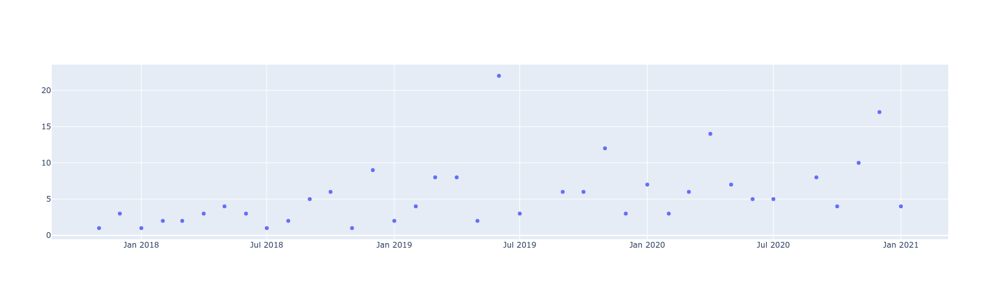

In [35]:
groupby = zp.df.datetime.dt.strftime("%Y-%m")
y = zp.df.groupby(groupby).size()
x = y.index
go.Figure(go.Scatter(x=x, y=y, mode="markers"))

In [36]:
zp.df.zpochybneni_IND.describe()

count      209
unique       1
top       True
freq       209
Name: zpochybneni_IND, dtype: object

In [37]:
# Poslední směnovna
o.df[(o.df.nazev_organu_cz == 'Poslanecká sněmovna') & o.df.do_organ.isna()]

,id_organ,organ_id_organ,id_typ_organu,zkratka,nazev_organu_cz,nazev_organu_en,od_organ,do_organ,cl_organ_base,id_typ_org,typ_id_typ_org,nazev_typ_org_cz,nazev_typ_org_en,typ_org_obecny
1192,172,<NA>,11,PSP8,Poslanecká sněmovna,Chamber of Deputies,2017-10-21,NaT,0,11,12,Parlament,Parliament,<NA>


In [38]:
# sněmovna 2017
o.df[(o.df.nazev_organu_cz == 'Poslanecká sněmovna') & (o.df.od_organ.dt.year == 2017)].iloc[0].id_organ

172

In [39]:
# Cesty pro stahování
hlasovani_file_name = f"hl-{volebni_obdobi}ps.zip"
hlasovani_url = f"https://www.psp.cz/eknih/cdrom/opendata/{hlasovani_file_name}"
hlasovani_zip = f"{hlasovani_dir}/{hlasovani_file_name}"

poslanci_file_name = f"poslanci.zip"
poslanci_url = f"https://www.psp.cz/eknih/cdrom/opendata/{poslanci_file_name}"
poslanci_zip = f"{poslanci_dir}/{poslanci_file_name}"

stenozaznamy_file_name = f"steno.zip"
stenozaznamy_url = f"https://www.psp.cz/eknih/cdrom/opendata/{stenozaznamy_file_name}"
stenozaznamy_zip = f"{stenozaznamy_dir}/{stenozaznamy_file_name}"

schuze_file_name = f"schuze.zip"
schuze_url = f"https://www.psp.cz/eknih/cdrom/opendata/{schuze_file_name}"
schuze_zip = f"{schuze_dir}/{schuze_file_name}"

In [40]:
download_and_unzip(hlasovani_url, hlasovani_zip, hlasovani_dir)
download_and_unzip(poslanci_url, poslanci_zip, poslanci_dir)
#download_and_unzip(stenozaznamy_url, stenozaznamy_zip, stenozaznamy_dir)
#download_and_unzip(schuze_url, schuze_zip, schuze_dir)


Vytvářím adresář: './data/hlasovani-2017ps/'
Stahuji data z: 'https://www.psp.cz/eknih/cdrom/opendata/hl-2017ps.zip'
Status: 200, headers: application/zip, encoding: None
Rozbaluji data do: './data/hlasovani-2017ps/'
Soubory v adresáři: ['hl2017v.unl', 'omluvy.unl', 'hl2017x.unl', 'hl2017s.unl', 'zmatecne.unl', 'hl2017h2.unl', 'hl-2017ps.zip', 'hl2017z.unl', 'hl2017h1.unl']

Vytvářím adresář: './data/poslanci/'
Stahuji data z: 'https://www.psp.cz/eknih/cdrom/opendata/poslanci.zip'
Status: 200, headers: application/zip, encoding: None
Rozbaluji data do: './data/poslanci/'
Soubory v adresáři: ['funkce.unl', 'typ_funkce.unl', 'osoby.unl', 'osoba_extra.unl', 'organy.unl', 'poslanci.zip', 'pkgps.unl', 'zarazeni.unl', 'typ_organu.unl', 'poslanec.unl', '1250_to_utf8.py']


# Cesty k tabulkám

V seznamu jsou uvedeny informace o všech relevantních tabulkách. Informace byly zkopírovány z popisu zdrojových dat.
Cesty k nepoužívaným tabulkám jsou ponechány pouze jako komentář.

In [41]:
# Hlasování - cesty k tabulkám, viz. https://www.psp.cz/sqw/hp.sqw?k=1302

# Souhrnné informace o hlasování
hlasovani_path = f"{hlasovani_dir}/hl{volebni_obdobi}s.unl"

# Výsledek hlasování jednotlivého poslance
#hlasovani_poslance_path = [f"{hlasovani_dir}/hl{volebni_obdobi}h1.unl", f"{hlasovani_dir}/hl{volebni_obdobi}h2.unl"] # Tato data analyzujeme v jiném jupyter notebooku

# Časové ohraničení omluv poslanců z jednání Poslanecké sněmovny.
omluvy_path = f"{hlasovani_dir}/omluvy.unl"

# Zpochybnění výsledků hlasování a případné opakované hlasování
zpochybneni_path = f"{hlasovani_dir}/hl{volebni_obdobi}z.unl"

# Poslanci, kteří oznámili zpochybnění hlasování
zpochybneni_poslancem_path = f"{hlasovani_dir}/hl{volebni_obdobi}x.unl"

# Vazba mezi stenozázamem a hlasováním, tj. ve kterém stenozáznamu proběhlo hlasování
stenozaznam_hlasovani_path = f"{hlasovani_dir}/hl{volebni_obdobi}v.unl"

# Hlasování, která byla prohlášena za zmatečné, tj. na jejich výsledek nebyl brán zřetel
zmatecne_path = f"{hlasovani_dir}/zmatecne.unl"

In [42]:
# Poslanci - cesty k tabulkám, viz. https://www.psp.cz/sqw/hp.sqw?k=1301

# Orgány mají svůj typ, tyto typy mají hiearchickou strukturu.
#typ_organu_path = f"{poslanci_dir}/typ_organu.unl"

# Typ funkce v orgánu - pro každý typ orgánu jsou definovány typy funkcí. Texty názvů typu funkce se používají při výpisu namísto textů v funkce:nazev_funkce_LL .
#typ_funkce_path = f"{poslanci_dir}/typ_funkce.unl"

#Záznam mezi orgánem a typem funkce, názvy v funkce:nazev_funkce_LL se používají pouze interně slouží k definování pořadí funkcionářů v případech, kdy je toto pořadí určeno.
#funkce_path = f"{poslanci_dir}/funkce.unl"

# Některé orgány mají nadřazený orgán a pak je položka organy:organ_id_organ vyplněna, přičemž pouze v některých případech se tyto vazby využívají.
organy_path = f"{poslanci_dir}/organy.unl"

# Jména osob, které jsou zařazeni v orgánech.
# Vzhledem k tomu, že k jednoznačnému rozlišení osob často není dostatek informací,
# je možné, že ne všechny záznamy odkazují na jedinečné osoby, tj. některé osoby jsou v tabulce vícekrát.
osoby_path = f"{poslanci_dir}/osoby.unl"

# Zařazení v orgánu nebo data funkcí osoby v orgánu. Pokud je zarazeni:do_o typu null, pak jde o aktuální zařazení.
osoby_zarazeni_path = f"{poslanci_dir}/zarazeni.unl"

# Další informace o poslanci vzhledem k volebnímu období: kontaktní údaje, adresa regionální kanceláře a podobně.
# Některé údaje jsou pouze v aktuálním volebním období.
poslanec_path = f"{poslanci_dir}/poslanec.unl"

# Obsahuje GPS souřadnice regionálních kanceláří poslanců.
#pkgps_path = f"{poslanci_dir}/pkgp.unl"

# Obsahuje vazby na externí systémy. Je-li typ = 1, pak jde o vazbu na evidenci senátorů na senat.cz
#osoba_extra_path = f"{poslanci_dir}/osoba_extra.unl"

# Tabulka hlasování

## Načtení tabulky hlasování (hlasovani_df)

In [43]:
import pandas as pd 

# Načti tabulku hlasování
header = {
    'id_hlasovani': 'int', 'id_organ': 'int', 'schuze': 'int', 'cislo': 'int', 'bod': 'int',    
    'datum': 'string', 'cas': 'string',
    "pro": 'int', "proti": 'int', "zdrzel": 'int', "nehlasoval": 'int', "prihlaseno": 'int', "kvorum": 'int',
    "druh_hlasovani": 'category', "vysledek": 'category',
    "nazev_dlouhy": 'string', "nazev_kratky": 'string'
}

hlasovani_df = pd.read_csv(hlasovani_path, sep="|", names = header.keys(),  index_col=False, encoding='ISO-8859-2') # doporučené 'cp1250' nefunguje, detekované 'ISO-8859-1' také nefunguje, 'ISO-8859-2' funguje.
hlasovani_df = hlasovani_df.astype(header)

# Oveř, že id_hlasovani lze použít jako index
#assert hlasovani_df.index.size == hlasovani_df.id_hlasovani.size
#hlasovani_df = hlasovani_df.set_index('id_hlasovani')

hlasovani_df.head()

,id_hlasovani,id_organ,schuze,cislo,bod,datum,cas,pro,proti,zdrzel,nehlasoval,prihlaseno,kvorum,druh_hlasovani,vysledek,nazev_dlouhy,nazev_kratky
0,67018,172,1,1,3,20.11.2017,13:53,191,0,5,0,196,99,N,A,Inf. o ustavení volební komise PS a volbě členů,<NA>
1,67019,172,1,2,3,20.11.2017,13:53,194,0,4,0,198,100,N,A,Inf. o ustavení volební komise PS a volbě členů,<NA>
2,67020,172,1,3,0,20.11.2017,14:47,50,129,19,0,198,100,N,R,,<NA>
3,67021,172,1,4,4,20.11.2017,15:39,56,100,37,6,199,100,N,R,Náv.na stanovení počtu čl. MIV,<NA>
4,67022,172,1,5,4,20.11.2017,15:39,174,19,4,2,199,100,N,A,Náv.na stanovení počtu čl. MIV,<NA>


In [44]:
# Odstraň whitespace z řetězců
hlasovani_df = strip_all_string_columns(hlasovani_df)

In [45]:
# Přidej sloupec typu 'datetime'
hlasovani_df['datetime'] = pd.to_datetime(hlasovani_df['datum'] + ' ' + hlasovani_df['cas'], format='%d.%m.%Y %H:%M')
tzn = pytz.timezone('Europe/Prague')
hlasovani_df['datetime'] = hlasovani_df['datetime'].dt.tz_localize(tzn)
hlasovani_df.head()

,id_hlasovani,id_organ,schuze,cislo,bod,datum,cas,pro,proti,zdrzel,nehlasoval,prihlaseno,kvorum,druh_hlasovani,vysledek,nazev_dlouhy,nazev_kratky,datetime
0,67018,172,1,1,3,20.11.2017,13:53,191,0,5,0,196,99,N,A,Inf. o ustavení volební komise PS a volbě členů,<NA>,2017-11-20 13:53:00+01:00
1,67019,172,1,2,3,20.11.2017,13:53,194,0,4,0,198,100,N,A,Inf. o ustavení volební komise PS a volbě členů,<NA>,2017-11-20 13:53:00+01:00
2,67020,172,1,3,0,20.11.2017,14:47,50,129,19,0,198,100,N,R,,<NA>,2017-11-20 14:47:00+01:00
3,67021,172,1,4,4,20.11.2017,15:39,56,100,37,6,199,100,N,R,Náv.na stanovení počtu čl. MIV,<NA>,2017-11-20 15:39:00+01:00
4,67022,172,1,5,4,20.11.2017,15:39,174,19,4,2,199,100,N,A,Náv.na stanovení počtu čl. MIV,<NA>,2017-11-20 15:39:00+01:00


In [46]:
# Přidej kontrolní sloupec pro součet hlasování
hlasovani_df['soucet_hlasovani'] =  hlasovani_df.pro + hlasovani_df.proti + hlasovani_df.nehlasoval + hlasovani_df.zdrzel

## Analýza tabulky hlasování (hlasovani_df)

In [69]:
popis_tabulku(hlasovani_df)

Počet řádků v tabulce: 8221

Počet unikátních hodnot pro každý sloupec:
id_hlasovani           8221
datetime               6852
mira_jednomyslnosti    2363
cislo                  1074
cas                     920
nazev_dlouhy            716
bod                     389
datum                   256
pro                     197
zdrzel                  157
proti                   156
soucet_hlasovani        149
prihlaseno              147
kvorum                   80
schuze                   78
nehlasoval               51
vysledek                  2
vysledek_cat              2
bod_cat                   2
druh_hlasovani_cat        1
druh_hlasovani            1
nazev_kratky              1
id_organ                  1
dtype: int64

Sloupce s jedinou hodnotou:
  'druh_hlasovani_cat' má všude hodnotu 'normální'
  'druh_hlasovani' má všude hodnotu 'N'
  'nazev_kratky' má všude hodnotu '<NA>'
  'id_organ' má všude hodnotu '172'


In [48]:
popis_nulove_hodnoty(hlasovani_df)

Sloupec 'nazev_dlouhy' obsahuje 0.04% (3 z 8221) NaNů.
Sloupec 'nazev_kratky' obsahuje 99.99% (8220 z 8221) NaNů.


In [49]:
popis_sloupec(hlasovani_df, 'bod')

Typ: int64
Počet hodnot: 8221
Počet unikátních hodnot: 389 (4.73%)
První hodnota: 3
Poslední hodnota: 68


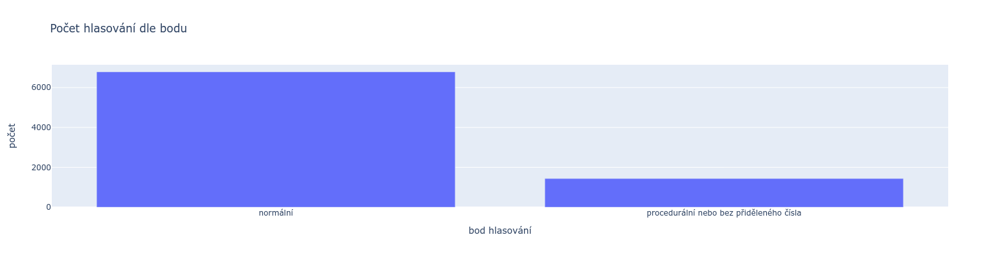

In [51]:
# Bod pořadu schůze; je-li menší než 1, pak jde o procedurální hlasování nebo o hlasování k bodům, které v době hlasování neměly přiděleno číslo.
hlasovani_df["bod_cat"] = hlasovani_df.bod.mask(hlasovani_df.bod < 1, 'procedurální nebo bez přiděleného čísla').mask(hlasovani_df.bod >= 1, "normální") 
fig = groupby_bar(hlasovani_df, by=['bod_cat'], xlabel='bod hlasování', ylabel='počet', title="Počet hlasování dle bodu")
fig.show()

In [52]:
popis_sloupec(hlasovani_df, 'vysledek')

Typ: object
Počet hodnot: 8221
Počet unikátních hodnot: 2 (0.02%)
První hodnota: A
Poslední hodnota: A


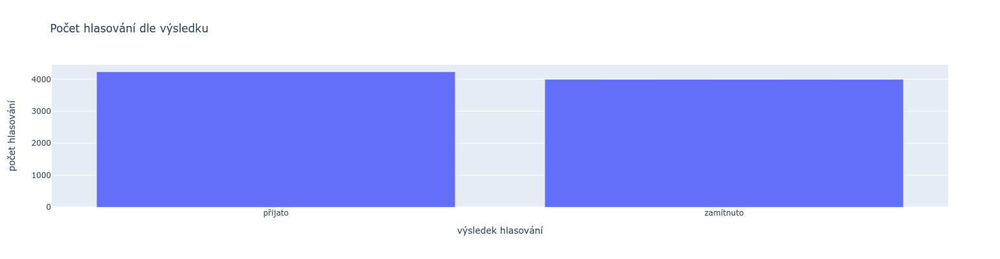

In [53]:
# Výsledek: A - přijato, R - zamítnuto, jinak zmatečné hlasování
hlasovani_df["vysledek_cat"] = hlasovani_df.vysledek.mask(hlasovani_df.vysledek == 'A', 'přijato').mask(hlasovani_df.vysledek == 'R', 'zamítnuto') 
fig = groupby_bar(hlasovani_df, by=['vysledek_cat'], xlabel='výsledek hlasování', ylabel='počet hlasování', title="Počet hlasování dle výsledku")
fig.show()

In [54]:
popis_sloupec(hlasovani_df, 'druh_hlasovani')

Typ: object
Počet hodnot: 8221
Počet unikátních hodnot: 1 (0.01%)
První hodnota: N
Poslední hodnota: N


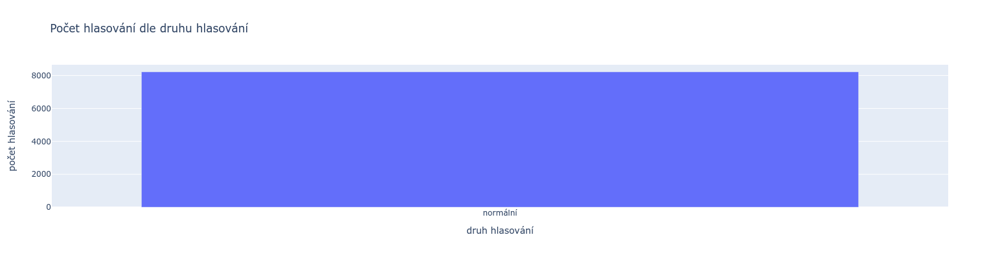

In [55]:
# Druh hlasování: N - normální, R - ruční (nejsou známy hlasování jednotlivých poslanců)
hlasovani_df["druh_hlasovani_cat"] = hlasovani_df.druh_hlasovani.mask(hlasovani_df.druh_hlasovani == 'N', 'normální').mask(hlasovani_df.druh_hlasovani == 'R', 'ruční') 
fig = groupby_bar(hlasovani_df, by=['druh_hlasovani_cat'], xlabel='druh hlasování', ylabel='počet hlasování', title="Počet hlasování dle druhu hlasování")
fig.show()

In [56]:
popis_sloupec(hlasovani_df, 'datetime')

Typ: datetime64[ns, Europe/Prague]
Počet hodnot: 8221
Počet unikátních hodnot: 6852 (83.35%)
První hodnota: 2017-11-20 13:53:00+01:00
Poslední hodnota: 2021-01-29 11:48:00+01:00


Nejvíce hlasování (1088) se uskutečnilo mezi 12:00 a 12:59
Nejméně hlasování (1) se uskutečnilo mezi 3:00 a 3:59


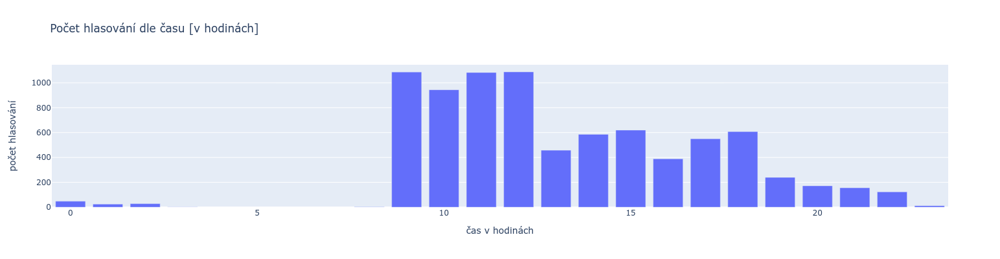

In [57]:
# hlasovani dle hodiny

df = hlasovani_df.groupby(hlasovani_df.datetime.dt.hour).size()
max_idx = df.sort_values().index[-1]
min_idx = df.sort_values().index[0]
print(f"Nejvíce hlasování ({df.loc[max_idx]}) se uskutečnilo mezi {max_idx}:00 a {max_idx}:59")
print(f"Nejméně hlasování ({df.loc[min_idx]}) se uskutečnilo mezi {min_idx}:00 a {min_idx}:59")

fig = go.Figure()

fig.add_trace(go.Bar(
    x=df.index,
    y=df.values,
    text=[f"{t}:00 - {t}:59" for t in df.index],
    hovertemplate="Interval: %{text}<br>Počet hlasování:%{y}<extra></extra>",
))

fig.update_layout(
    title="Počet hlasování dle času [v hodinách]",
    xaxis_title="čas v hodinách",
    yaxis_title="počet hlasování",
    width=600,
    height=400
)

fig.show()

Nejvíce hlasování (3514) se uskutečnilo v středa.
Nejméně hlasování (7) se uskutečnilo v pondělí.


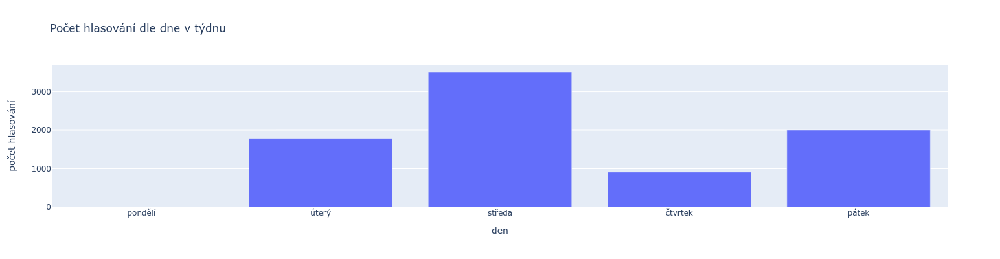

In [58]:
# hlasovani dle dne z týdne

day_dict = {'Monday':'pondělí', "Tuesday":'úterý', "Wednesday":'středa', "Thursday":'čtvrtek', "Friday":'pátek', "Saturday":'sobota', "Sunday":'neděle'}

df = hlasovani_df.groupby(hlasovani_df.datetime.dt.strftime('%A').map(day_dict)).size()
max_idx = df.sort_values().index[-1]
min_idx = df.sort_values().index[0]
print(f"Nejvíce hlasování ({df.loc[max_idx]}) se uskutečnilo v {max_idx}.")
print(f"Nejméně hlasování ({df.loc[min_idx]}) se uskutečnilo v {min_idx}.")

fig = go.Figure()

index = list(day_dict.values())[:5] # pondělí ... pátek
values = [df.loc[d] for d in index]
text = index
fig.add_trace(go.Bar(
    x=index,
    y=values,
    text=text,
    hovertemplate="Den: %{text}<br>Počet hlasování:%{y}<extra></extra>",
))

fig.update_layout(
    title="Počet hlasování dle dne v týdnu",
    xaxis_title="den",
    yaxis_title="počet hlasování",
    width=600,
    height=400
)

fig.show()

In [59]:
# V pondělí se hlasuje velmi zřídka, z5ejmě jen na 1. schůzi
hlasovani_df[hlasovani_df.datetime.dt.strftime("%A") == 'Monday']

,id_hlasovani,id_organ,schuze,cislo,bod,datum,cas,pro,proti,zdrzel,...,kvorum,druh_hlasovani,vysledek,nazev_dlouhy,nazev_kratky,datetime,soucet_hlasovani,bod_cat,vysledek_cat,druh_hlasovani_cat
0,67018,172,1,1,3,20.11.2017,13:53,191,0,5,...,99,N,A,Inf. o ustavení volební komise PS a volbě členů,<NA>,2017-11-20 13:53:00+01:00,196,normální,přijato,normální
1,67019,172,1,2,3,20.11.2017,13:53,194,0,4,...,100,N,A,Inf. o ustavení volební komise PS a volbě členů,<NA>,2017-11-20 13:53:00+01:00,198,normální,přijato,normální
2,67020,172,1,3,0,20.11.2017,14:47,50,129,19,...,100,N,R,,<NA>,2017-11-20 14:47:00+01:00,198,procedurální nebo bez přiděleného čísla,zamítnuto,normální
3,67021,172,1,4,4,20.11.2017,15:39,56,100,37,...,100,N,R,Náv.na stanovení počtu čl. MIV,<NA>,2017-11-20 15:39:00+01:00,199,normální,zamítnuto,normální
4,67022,172,1,5,4,20.11.2017,15:39,174,19,4,...,100,N,A,Náv.na stanovení počtu čl. MIV,<NA>,2017-11-20 15:39:00+01:00,199,normální,přijato,normální
5275,72295,172,40,338,0,02.03.2020,13:14,0,0,0,...,1,N,R,,<NA>,2020-03-02 13:14:00+01:00,0,procedurální nebo bez přiděleného čísla,zamítnuto,normální
7147,74167,172,62,165,0,26.10.2020,08:45,0,0,0,...,1,N,R,,<NA>,2020-10-26 08:45:00+01:00,0,procedurální nebo bez přiděleného čísla,zamítnuto,normální


In [60]:
def pocet_hlasovani_dle_data(df, resample_to, resample_str, resample_label):
    frame = df.set_index('datetime').resample(resample_to).size()
    frame = frame.mask(frame == 0, None).dropna()

    max_idx = frame.sort_values().index[-1]
    min_idx = frame.sort_values().index[0]
    print(f"Nejvíce hlasování ({frame.loc[max_idx]}) se uskutečnilo {max_idx.strftime(resample_str)}.")
    print(f"Nejméně hlasování ({frame.loc[min_idx]}) se uskutečnilo {min_idx.strftime(resample_str)}.")

    fig = go.Figure()
    fig.add_trace(go.Bar(
        x=frame.index,
        y=frame.values,
        hovertemplate="%{x}<br>počet hlasování: %{y}<extra></extra>"
    ))
    
    fig.update_layout(
        title=f"Počet hlasování dle data ({resample_label})",
        xaxis_title=f"datum ({resample_label})",
        yaxis_title="počet hlasování",
        width=1200,
        height=500
    )

    dt_all = pd.date_range(start=frame.index[0],end=frame.index[-1])
    dt_obs = [d.strftime(resample_str) for d in frame.index]
    dt_breaks = [d for d in dt_all.strftime(resample_str).tolist() if not d in dt_obs]
    # nezobrazuj data bez hlasování
    #dt_all = pd.date_range(start=df.index[0], end=df.index[-1])
    #dt_obs = [d.strftime(resample_str) for d in df.index]
    #dt_breaks = [d for d in dt_all.strftime(resample_str).tolist() if not d in dt_obs]

    fig.update_xaxes(
        rangebreaks=[dict(values=dt_breaks)]
    )
    
    fig.show()

Nejvíce hlasování (387) se uskutečnilo 2019-06-05.
Nejméně hlasování (1) se uskutečnilo 2020-10-26.


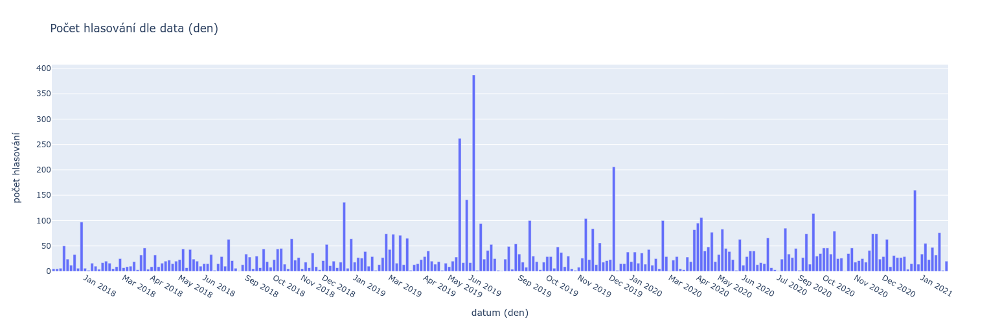

In [61]:
pocet_hlasovani_dle_data(hlasovani_df, "D", "%Y-%m-%d", "den")

Nejvíce hlasování (646) se uskutečnilo 2019-06.
Nejméně hlasování (13) se uskutečnilo 2018-08.


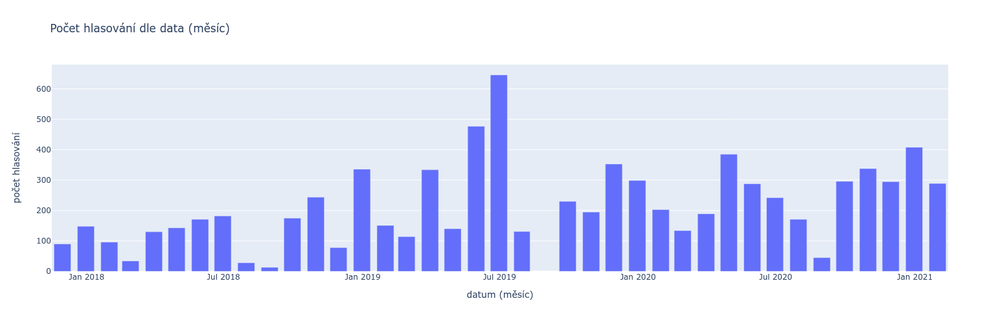

In [62]:
pocet_hlasovani_dle_data(hlasovani_df, "M", "%Y-%m", "měsíc")

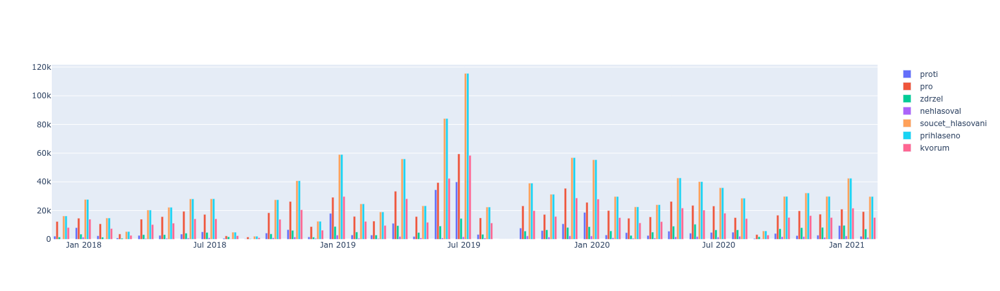

In [63]:
def resampled_scatter(df, field, interval="D", date_format="%Y-%m-%d", operation='sum', name=None, type='scatter'):
    name = name if name is not None else field    
    #frame = df[field].groupby(df["datetime"].dt.strftime(date_format)).size()
    frame = df.set_index("datetime")[field].resample(interval).agg(operation)
    trace = go.Bar(x=frame.index, y=frame.values, name=name)
    return trace

interval = 'M'
fig = go.Figure()
fig.add_trace(resampled_scatter(hlasovani_df, field="proti", interval=interval))
fig.add_trace(resampled_scatter(hlasovani_df, field="pro", interval=interval))
fig.add_trace(resampled_scatter(hlasovani_df, field="zdrzel", interval=interval))
fig.add_trace(resampled_scatter(hlasovani_df, field="nehlasoval", interval=interval))
fig.add_trace(resampled_scatter(hlasovani_df, field="soucet_hlasovani", interval=interval))
fig.add_trace(resampled_scatter(hlasovani_df, field="prihlaseno", interval=interval))
fig.add_trace(resampled_scatter(hlasovani_df, field="kvorum", interval=interval))

fig.show()

In [64]:
# Najdi nekonzistentní součty vysledků hlasování

fields = ["schuze", "bod", "nazev_dlouhy", "pro", "proti", "nehlasoval", "zdrzel", "prihlaseno"]
hlasovani_df[hlasovani_df.soucet_hlasovani != hlasovani_df.prihlaseno][fields]

,schuze,bod,nazev_dlouhy,pro,proti,nehlasoval,zdrzel,prihlaseno
1531,23,1,Návrh na vyslovení nedůvěry vládě České republiky,92,92,18,0,182
3729,32,1,Návrh na vyslovení nedůvěry vládě České republiky,85,85,18,12,182


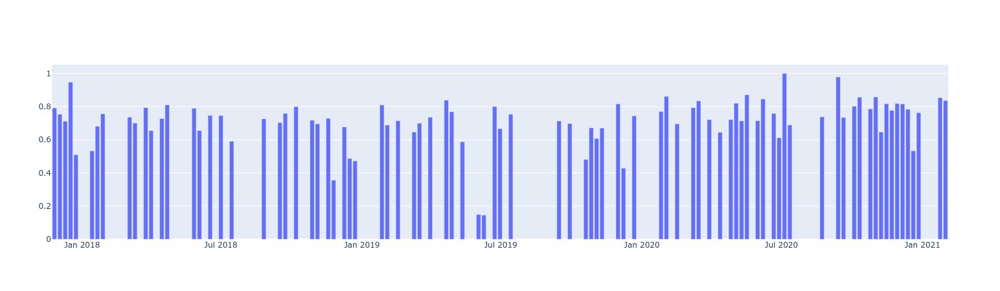

In [65]:
hlasovani_df["mira_jednomyslnosti"] = (hlasovani_df.pro - hlasovani_df.proti).abs() / (hlasovani_df.pro + hlasovani_df.proti)

interval = 'W'
fig = go.Figure()
fig.add_trace(resampled_scatter(hlasovani_df, field="mira_jednomyslnosti", interval=interval, operation="mean"))
fig.show()

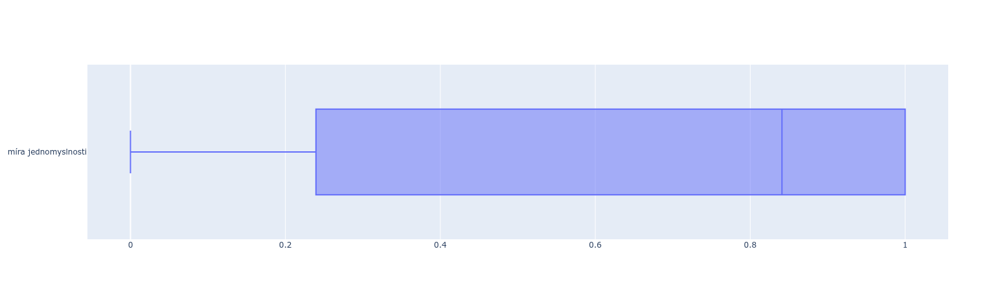

In [66]:
go.Figure(go.Box(x=hlasovani_df["mira_jednomyslnosti"], name="míra jednomyslnosti"))

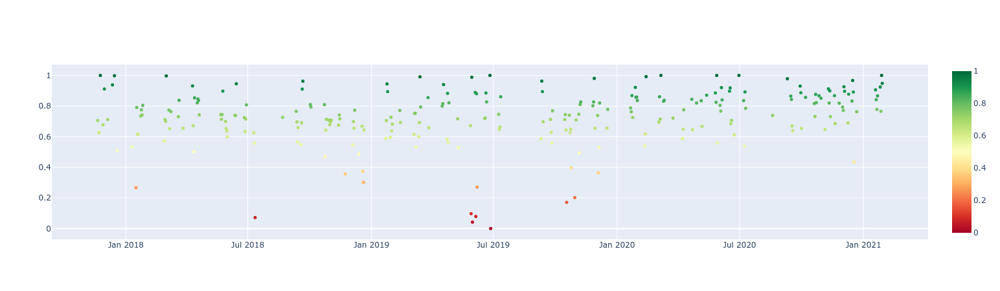

In [67]:
# denní míra jednomyslnosti

precision = 3 

def A_razeno_dle_B(x, A, B):
    df = x.groupby(A)[B].mean().sort_values(ascending=True)
    return("<br>".join(map(str, df.index.astype(str) + ': ' + df.values.round(precision).astype(str))))

days = 7
interval = f"{days}D"

df = pd.DataFrame()
df['mira_jednomyslnosti_za_den_mean'] = hlasovani_df.groupby(hlasovani_df.datetime.dt.date).mira_jednomyslnosti.mean()
df['nazev_dlouhy_za_den'] = hlasovani_df.groupby(hlasovani_df.datetime.dt.date)[['nazev_dlouhy', 'mira_jednomyslnosti']].apply(
    lambda x: A_razeno_dle_B(x, "nazev_dlouhy", "mira_jednomyslnosti"
)) 
df.index = pd.to_datetime(df.index)

fig = go.Figure()

fig.add_trace(go.Scatter(
    x=df.index,
    y=df.mira_jednomyslnosti_za_den_mean,
    text=df.nazev_dlouhy_za_den,
    name="míra jednomyslnosti za den",
    mode="markers",
     marker=dict(
        size=5,
        color=df.mira_jednomyslnosti_za_den_mean,
        colorscale='RdYlGn', # one of plotly colorscales
        showscale=True
    ),
    hovertemplate =
        '<b>%{x}</b>'+
        '<br><br><b>Průměrná míra jednomyslnosti</b>: <i>%{y:.3f}</i>'+
        '<br><br><b>Hlasování dle míry jednomyslnosti (vzestupně):</b><br>%{text}<extra></extra>',
    hoverlabel=dict(
        bgcolor='white',
        font=dict(color='black')
    )
))

#df['mira_jednomyslnosti_za_den_rolling_mean'] = df.mira_jednomyslnosti_za_den_mean.rolling(interval).mean()
#fig.add_trace(go.Scatter(
#    x=df.index,
#    y=df.mira_jednomyslnosti_za_den_rolling_mean,
#    name=f"míra jednomyslnosti - klouzavý průměr za {days} dní",
#    mode="markers"
#))

fig.show()

## Tabulka stenozáznamů hlasování (stenozaznam_hlasovani_df)

In [181]:
# načti tabulku vazeb hlasovani na stenozaznam

header = { "id_hlasovani": 'int', "turn": 'int', "typ": 'int'}

stenozaznam_hlasovani_df = pd.read_csv(stenozaznam_hlasovani_path, sep="|", names = header.keys(),  index_col=False, encoding='cp1250')
stenozaznam_hlasovani_df = stenozaznam_hlasovani_df.astype(header)

# Oveř, že id_hlasovani lze použít jako index
assert stenozaznam_hlasovani_df.index.size == stenozaznam_hlasovani_df.id_hlasovani.size
stenozaznam_hlasovani_df = stenozaznam_hlasovani_df.set_index('id_hlasovani')

stenozaznam_hlasovani_df.head()

,turn,typ
id_hlasovani,,
58302,6,0
58303,6,0
58304,6,0
58305,7,0
58306,9,0


In [177]:
popis_tabulku(stenozaznam_hlasovani_df)

Počet řádků v tabulce: 8606

Počet unikátních hodnot pro každý sloupec:
id_hlasovani    8606
turn             410
typ                2
dtype: int64

Sloupce s identickou hodnotou:



In [178]:
popis_nulove_hodnoty(stenozaznam_hlasovani_df)

Tabulka neobsahuje žádné nulové hodnoty.


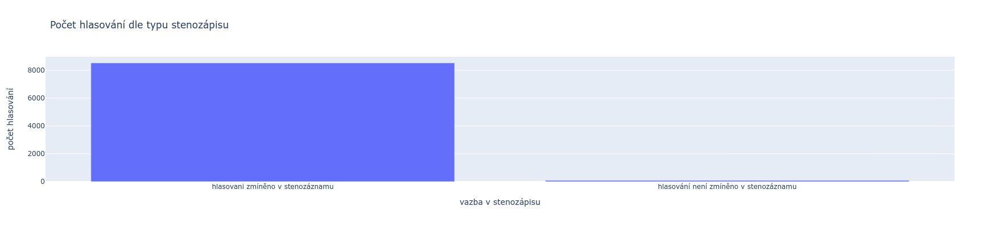

In [292]:
stenozaznam_hlasovani_df["typ_cat"] = mask_by_values(stenozaznam_hlasovani_df, "typ", {0: "hlasovani zmíněno v stenozáznamu", 1: "hlasování není zmíněno v stenozáznamu"})
fig = groupby_bar(stenozaznam_hlasovani_df, by=['typ_cat'], xlabel='vazba v stenozápisu', ylabel='počet hlasování', title="Počet hlasování dle typu stenozápisu")
fig.show()

## Tabulka zpochybnění hlasování (zpochybneni_hlasovani_df)

In [586]:
# Načti tabulku zpochybneni hlasovani (hl_check)

header = { "id_hlasovani": 'Int64', "turn": 'Int64', "mode": 'Int64', "id_h2": 'Int64', "id_h3": 'Int64'}

zpochybneni_hlasovani_df = pd.read_csv(zpochybneni_path, sep="|", names = header.keys(),  index_col=False, encoding='cp1250')
#zpochybneni_hlasovani_df = zpochybneni_hlasovani_df.astype(header)

# Oveř, že id_hlasovani lze použít jako index
assert zpochybneni_hlasovani_df.index.size == zpochybneni_hlasovani_df.id_hlasovani.size
zpochybneni_hlasovani_df = zpochybneni_hlasovani_df.set_index('id_hlasovani')

zpochybneni_hlasovani_df.head()

,turn,mode,id_h2,id_h3
id_hlasovani,,,,
55680,67,0,55681.0,55682.0
55664,43,0,55665.0,55666.0
55590,244,0,55591.0,55592.0
55561,200,0,55562.0,55563.0
55555,199,0,55556.0,55557.0


In [587]:
popis_tabulku(zpochybneni_hlasovani_df)

Počet řádků v tabulce: 719

Počet unikátních hodnot pro každý sloupec:
id_h2    381
id_h3    340
turn     281
mode       3
dtype: int64

Každý sloupec obsahuje alespoň dvě hodnoty.


In [588]:
popis_nulove_hodnoty(zpochybneni_hlasovani_df)

Sloupec 'id_h2' obsahuje 46.18% (332 z 719) NaNů.
Sloupec 'id_h3' obsahuje 47.01% (338 z 719) NaNů.


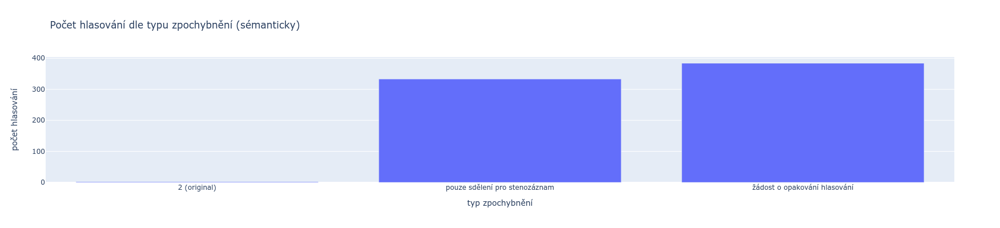

In [589]:
# 0 - žádost o opakování hlasování - v tomto případě se o této žádosti neprodleně hlasuje a teprve je-li tato žádost přijata, je hlasování opakováno;
# 1 - pouze sdělení pro stenozáznam, není požadováno opakování hlasování.

semanticka_maska = {0: "žádost o opakování hlasování", 1: "pouze sdělení pro stenozáznam"}
zpochybneni_hlasovani_df["mode_cat"] = mask_by_values(zpochybneni_hlasovani_df, "mode", semanticka_maska)
zpochybneni_hlasovani_df["mode_cat"].value_counts()
fig = groupby_bar(zpochybneni_hlasovani_df, by=['mode_cat'], xlabel='typ zpochybnění', ylabel='počet hlasování', title="Počet hlasování dle typu zpochybnění (sémanticky)")
fig.show()

In [590]:
column = 'mode'
df = zpochybneni_hlasovani_df
h = list(set(df[column].unique()) - set(semanticka_maska.keys()))
print(f"Neinterpretovatelné hodnoty v sloupci: '{column}': {h}")

Neinterpretovatelné hodnoty v sloupci: 'mode': [2]


In [591]:
# Jsou zpochybněná hlasování uvedená v tabulce hlasovani_df? 

h_ids = set(hlasovani_df.index)
z_all_ids = set(zpochybneni_hlasovani_df.index)
print(f"Všechna zpochybněná hlasování = {len(h_ids.intersection(z_all_ids))}")
print(f"Všechna zpochybněná hlasování s opakováním hlasování = {len(h_ids.intersection(z_opak_ids))}")
print(f"Všechna zpochybněná hlasování bez opakování hlasování = {len(h_ids.intersection(z_bez_opak_ids))}")

Všechna zpochybněná hlasování = 195
Všechna zpochybněná hlasování s opakováním hlasování = 68
Všechna zpochybněná hlasování bez opakování hlasování = 126


In [592]:
# příklad zpochybněných hlasování
fields = ['nazev_dlouhy', 'schuze', 'cislo', 'bod', 'datum', 'cas', 'pro', 'proti', 'zdrzel', 'nehlasoval', 'prihlaseno', 'kvorum', 'vysledek']
hlasovani_df[hlasovani_df.index.isin(z_all_ids)][fields].head()

,nazev_dlouhy,schuze,cislo,bod,datum,cas,pro,proti,zdrzel,nehlasoval,prihlaseno,kvorum,vysledek
id_hlasovani,,,,,,,,,,,,,
67024,Návrh na potvrzení předsedy MIV,1,7,7,22.11.2017,12:57,115,66,9,4,194,98,A
67157,Návrh na změny ve složení orgánů Poslanecké sn...,4,38,10,15.12.2017,09:15,173,0,1,1,175,88,A
67218,Vl.n.z. o státním rozpočtu ČR na rok 2018,4,99,4,19.12.2017,19:08,103,79,13,4,199,100,A
67237,Vl.n.z. o státním rozpočtu ČR na rok 2018,4,118,4,19.12.2017,19:31,81,78,27,13,199,100,R
67307,"N.z., kterým se ruší zákon o prodejní době",6,44,9,23.01.2018,17:58,102,57,3,3,165,83,A


In [593]:
# Nejčastěji zpochybňovaná hlasování
cnt = 10
hlasovani_df[hlasovani_df.index.isin(z_all_ids)].groupby("nazev_dlouhy").size().sort_values(ascending=False).head(cnt)

nazev_dlouhy
Pořad schůze                                                          29
Novela z. o evidenci tržeb - EU                                       11
Vl.n.z. o státním rozpočtu ČR na rok 2021                              7
Vl. n. z. kterým se mění některé zákony v oblasti daní - EU            5
                                                                       4
Vl.n.z., kterým se mění některé zákony v oblasti daní - EU             4
Novela ústav. z. - Ústava ČR                                           4
Návrh na vyslovení souhlasu PS s prodloužením doby nouzového stavu     4
Novela z. o majetkovém vyrovnání s církvemi                            3
Vl.n.z. o státním rozpočtu ČR na rok 2020                              3
dtype: int64

## Tabulka zpochybnění hlasování poslancem (zpochybneni_poslancem_df)

In [594]:
# Načti tabulku zpochybneni hlasovani (hl_check)

header = { "id_hlasovani": 'Int64', "id_osoba": 'Int64', "mode": 'Int64'}

zpochybneni_poslancem_df = pd.read_csv(zpochybneni_poslancem_path, sep="|", names = header.keys(),  index_col=False, encoding='cp1250')
zpochybneni_poslancem_df = zpochybneni_poslancem_df.astype(header)

zpochybneni_poslancem_df.head()

,id_hlasovani,id_osoba,mode
0,55680,5971,0
1,55664,5899,0
2,55590,5893,0
3,55561,5985,0
4,55555,5507,0


In [595]:
popis_tabulku(zpochybneni_poslancem_df)

Počet řádků v tabulce: 743

Počet unikátních hodnot pro každý sloupec:
id_hlasovani    706
id_osoba        305
mode              3
dtype: int64

Každý sloupec obsahuje alespoň dvě hodnoty.


In [596]:
popis_nulove_hodnoty(zpochybneni_poslancem_df)

Tabulka neobsahuje žádné nulové hodnoty.


In [622]:
zpochybneni_hlasovani_df

,turn,mode,id_h2,id_h3,mode_cat
id_hlasovani,,,,,
55680,67,0,55681.0,55682.0,žádost o opakování hlasování
55664,43,0,55665.0,55666.0,žádost o opakování hlasování
55590,244,0,55591.0,55592.0,žádost o opakování hlasování
55561,200,0,55562.0,55563.0,žádost o opakování hlasování
55555,199,0,55556.0,55557.0,žádost o opakování hlasování
...,...,...,...,...,...
74805,252,1,NaN,NaN,pouze sdělení pro stenozáznam
74969,7,1,NaN,NaN,pouze sdělení pro stenozáznam
74974,20,1,NaN,NaN,pouze sdělení pro stenozáznam


In [642]:
intervals = [
    {"start": hlasovani_df.index.max(), "end": hlasovani_df.index.min(), "label": "hlasovani_df"},
    {"start": zmatecne_hlasovani_df.index.max(), "end": zmatecne_hlasovani_df.index.min(), "label": "zmatecne_hlasovani_df"},
    {"start": zpochybneni_hlasovani_df.index.max(), "end": zpochybneni_hlasovani_df.index.min(), "label": "zpochybneni_hlasovani_df"},
    {"start": zpochybneni_poslancem_df.id_hlasovani.max(), "end": zpochybneni_poslancem_df.index.min(), "label": "zpochybneni_poslancem_df"},

[0, 1, 2, 3]

In [823]:
snemovna2013 = Snemovna(2013, data_dir='./data/snemovna2013')


Vytvářím adresář: './data/snemovna2013'
Stahuji data z: 'https://www.psp.cz/eknih/cdrom/opendata/hl-2013ps.zip'
Status: 200, headers: application/zip, encoding: None
Rozbaluji data do: './data/snemovna2013'
Soubory v adresáři: ['funkce.unl', 'typ_funkce.unl', 'osoby.unl', 'osoba_extra.unl', 'omluvy.unl', 'organy.unl', 'poslanci.zip', 'pkgps.unl', 'zarazeni.unl', 'typ_organu.unl', 'zmatecne.unl', 'hl2013s.unl', 'hl2013x.unl', 'hl2013v.unl', 'hl-2013ps.zip', 'poslanec.unl', 'hl2013h1.unl', 'hl2013z.unl', 'hl2013h2.unl']

Vytvářím adresář: './data/snemovna2013'
Stahuji data z: 'https://www.psp.cz/eknih/cdrom/opendata/poslanci.zip'
Status: 200, headers: application/zip, encoding: None
Rozbaluji data do: './data/snemovna2013'
Soubory v adresáři: ['funkce.unl', 'typ_funkce.unl', 'osoby.unl', 'osoba_extra.unl', 'omluvy.unl', 'organy.unl', 'poslanci.zip', 'pkgps.unl', 'zarazeni.unl', 'typ_organu.unl', 'zmatecne.unl', 'hl2013s.unl', 'hl2013x.unl', 'hl2013v.unl', 'hl-2013ps.zip', 'poslanec.unl'

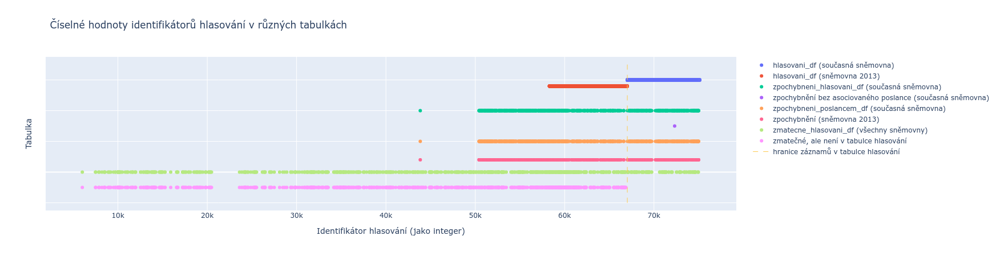

In [824]:
# Vizualizace id_hlasovani pro různé tabulky

# Z dat lze usoudit, že pro současnou sněmovnu (2017) neexistuje zmatečné hlasování, které by nebylo uvedeno v tabulce hlasování,
# protože všechny záznamy 'zmatecne_bez_hlasovani_ids' mají ids menší než je začátek ids hlasovani současné směnovny.

# Z dat lze usoudit, že hlasování nemůže být současně zmatečné a zpochybněné poslancem.

# Divné: Pro současnou sněmovnu existují ids zpochybnění hlasování, která jsou nižší než ids v tabulce hlasování.

id_hlasovani_threshold = hlasovani_df.index.min()

zpochybneni_bez_poslance_ids = list(set(zpochybneni_hlasovani_df.index) - set(zpochybneni_poslancem_df.id_hlasovani))
zpochybneni_a_zmatecne_ids = list(set(zpochybneni_hlasovani_df.index).intersection(zmatecne_hlasovani_df.index))
zmatecne_bez_hlasovani_ids = list(set(zmatecne_hlasovani_df.index) - set(hlasovani_df.index))

zpochybneni2017_bez_zpochybneni2013_ids = list(set(zpochybneni_hlasovani_df.index) - set(snemovna2013.hlasovani.zpochybneni.index))

marker=dict(size=1, line=dict(width=0))
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=hlasovani_df.sort_index().reset_index().reset_index().id_hlasovani,
    y = [3]*hlasovani_df.index.size,
    name = "hlasovani_df (současná sněmovna)",
    hovertemplate="hlasovani_df (současná sněmovna)<br>%{x:.0}<extra></extra>",
    mode="markers"
))

fig.add_trace(go.Scatter(
    x=snemovna2013.hlasovani.df.sort_index().reset_index().reset_index().id_hlasovani,
    y = [2.8]*snemovna2013.hlasovani.df.size,
    name = "hlasovani_df (sněmovna 2013)",
    hovertemplate="hlasovani_df (sněmovna 2013)<br>%{x:.0}<extra></extra>",
    mode="markers"
))

fig.add_trace(go.Scatter(
    x=zpochybneni_hlasovani_df.sort_index().reset_index().reset_index().id_hlasovani, 
    y = [2]*zpochybneni_hlasovani_df.index.size,
    name="zpochybneni_hlasovani_df (současná sněmovna)",
    hovertemplate="zpochybneni_hlasovani_df (současná sněmovna)<br>%{x:.0}<extra></extra>",
    mode="markers"
))

fig.add_trace(go.Scatter(
    x=zpochybneni_bez_poslance_ids,
    y = [1.5]*len(zpochybneni_bez_poslance_ids),
    name="zpochybnění bez asociovaného poslance (současná sněmovna)",
    hovertemplate="zpochybnění bez uvedeného poslance (současná sněmovna)<br>%{x:.0}<extra></extra>",
    mode="markers"
))

fig.add_trace(go.Scatter(
    x=zpochybneni_poslancem_df.id_hlasovani.sort_values(),
    y = [1]*zpochybneni_poslancem_df.id_hlasovani.size,
    name="zpochybneni_poslancem_df (současná sněmovna)",
    hovertemplate="zpochybneni_poslancem_df (současná sněmovna)<br>%{x:.0}<extra></extra>",
    mode="markers"
))

fig.add_trace(go.Scatter(
    x=zpochybneni2017_bez_zpochybneni2013_ids,
    y = [-0.8]*len(zpochybneni2017_bez_zpochybneni2013_ids),
    name="zpochybnění hlasování 2017 - 2013",
    hovertemplate="zpochybnění hlasování 2017 - 2013<br>%{x:.0}<extra></extra>",
    mode="markers"
))


fig.add_trace(go.Scatter(
    x=snemovna2013.hlasovani.zpochybneni.sort_index().reset_index().reset_index().id_hlasovani,
    y = [0.4]*snemovna2013.hlasovani.zpochybneni.index.size,
    name="zpochybnění (sněmovna 2013)",
    hovertemplate="zpochybnění (sněmovna 2013)<br>%{x:.0}<extra></extra>",
    mode="markers"
))

fig.add_trace(go.Scatter(
    x=zmatecne_hlasovani_df.sort_index().reset_index().reset_index().id_hlasovani,
    y = [0]*zmatecne_hlasovani_df.index.size,
    name="zmatecne_hlasovani_df (všechny sněmovny)",
    hovertemplate="zmatecne_hlasovani_df (všechny sněmovny)<br>%{x:.0}<extra></extra>",
    mode="markers"
))

fig.add_trace(go.Scatter(
    x=zmatecne_bez_hlasovani_ids,
    y = [-0.5]*len(zmatecne_bez_hlasovani_ids),
    name="zmatečné, ale není v tabulce hlasování",
    hovertemplate="zmatečné, ale není v tabulce hlasování<br>%{x:.0}<extra></extra>",
    mode="markers"
))

fig.add_trace(go.Scatter(
    x=[id_hlasovani_threshold]*2,
    y=[-1, 3.5],
    name="hranice záznamů v tabulce hlasování",
    hovertemplate="hranice záznamů v tabulce hlasování<extra></extra>",
    mode="lines",
    line=dict(width=1, dash='dash')
))

fig.update_layout(title="Číselné hodnoty identifikátorů hlasování v různých tabulkách",  yaxis=dict(title='Tabulka', showticklabels=False), xaxis=dict(title='Identifikátor hlasování (jako integer)'))
fig.show()

In [610]:
# více osob může zpochynit jedno hlasování, tj. 'id_hlasování' není pro každý řádek unikátní
zpochybneni_hlasovani_df.index
set(zpochybneni_poslancem_df.id_osoba) - set(poslanci_df.id_osoba.unique())
zpochybneni_poslancem_curr_df = zpochybneni_poslancem_df[zpochybneni_poslancem_df.id_hlasovani.isin(zpochybneni_hlasovani_df.index)]
zpochybneni_poslancem_curr_df.groupby(["id_hlasovani"]).size().sort_values()

id_hlasovani
43841    1
63320    1
63323    1
63371    1
63373    1
        ..
73086    2
53832    3
61340    3
69585    3
64415    4
Length: 706, dtype: int64

In [605]:
zpochybneni_poslancem_curr_df[zpochybneni_poslancem_curr_df.id_hlasovani == 43841] # hodnota byla nalezena v tabulce zpochybnění poslancem
zpochybneni_hlasovani_df[zpochybneni_hlasovani_df.index == 43841] # hodnota byla nalezena v aktuální tabulce zpochybnění
#hlasovani_df[hlasovani_df.index == 43841] # hodnota nebyla nalezena v aktuální tabulce zpochybnění
hlasovani_df[hlasovani_df.index == 73086]

,id_organ,schuze,cislo,bod,datum,cas,pro,proti,zdrzel,nehlasoval,...,druh_hlasovani,vysledek,nazev_dlouhy,nazev_kratky,datetime,soucet_hlasovani,bod_cat,vysledek_cat,druh_hlasovani_cat,mira_jednomyslnosti
id_hlasovani,,,,,,,,,,,,,,,,,,,,,
73086,172,49,57,375,27.05.2020,18:12,44,9,73,37,...,N,R,Žádost PČR o vyslovení souhlasu PS k trestnímu...,<NA>,2020-05-27 18:12:00+02:00,163,normální,zamítnuto,normální,0.660377


In [540]:
# platí, že zpochybnění hlasování může být iniciováno pouze poslancem?
print(zpochybneni_poslancem_df.columns)
zpochybneni_poslancem_df.groupby(["id_hlasovani"]).size().sort_values()

Index(['id_hlasovani', 'id_osoba', 'mode'], dtype='object')


id_hlasovani
43841    1
63320    1
63323    1
63371    1
63373    1
        ..
73086    2
53832    3
61340    3
69585    3
64415    4
Length: 706, dtype: int64

In [603]:
df = pd.merge(left=zpochybneni_poslancem_df, right=zpochybneni_hlasovani_df, on='id_hlasovani', how='inner', indicator="zpochybneni_merge")
df.head()

,id_hlasovani,id_osoba,mode_x,turn,mode_y,id_h2,id_h3,mode_cat,zpochybneni_merge
0,55680,5971,0,67,0,55681.0,55682.0,žádost o opakování hlasování,both
1,55664,5899,0,43,0,55665.0,55666.0,žádost o opakování hlasování,both
2,55590,5893,0,244,0,55591.0,55592.0,žádost o opakování hlasování,both
3,55561,5985,0,200,0,55562.0,55563.0,žádost o opakování hlasování,both
4,55555,5507,0,199,0,55556.0,55557.0,žádost o opakování hlasování,both


## Tabulka zmatečného hlasování (zmatecne_hlasovani_df)

In [514]:
# načti tabulku zmatecneho hlasovani
# výsledky zmatečného hlasování se neberou v úvahu

header = {"id_hlasovani": "Int64"}

zmatecne_hlasovani_df = pd.read_csv(zmatecne_path, sep="|", names = header.keys(),  index_col=False, encoding='cp1250')
zmatecne_hlasovani_df = zmatecne_hlasovani_df.astype(header)

# Oveř, že id_hlasovani lze použít jako index
assert zmatecne_hlasovani_df.index.size == zmatecne_hlasovani_df.id_hlasovani.size
zmatecne_hlasovani_df = zmatecne_hlasovani_df.set_index('id_hlasovani')

zmatecne_hlasovani_df.head()

""
id_hlasovani
6018
7496
7506
7854
7934


In [515]:
h_ids = set(hlasovani_df.index)
z_ids = set(zmatecne_hlasovani_df.index)
print(f"Všechna zmatečná hlasování = {len(h_ids.intersection(z_ids))}")

Všechna zmatečná hlasování = 108


In [532]:
ids = set(hlasovani_df.index).intersection(set(zmatecne_hlasovani_df.index))
hlasovani_df[hlasovani_df.index.isin(ids)].head()

,id_organ,schuze,cislo,bod,datum,cas,pro,proti,zdrzel,nehlasoval,...,druh_hlasovani,vysledek,nazev_dlouhy,nazev_kratky,datetime,soucet_hlasovani,bod_cat,vysledek_cat,druh_hlasovani_cat,mira_jednomyslnosti
id_hlasovani,,,,,,,,,,,,,,,,,,,,,
67018,172,1,1,3,20.11.2017,13:53,191,0,5,0,...,N,A,Inf. o ustavení volební komise PS a volbě členů,<NA>,2017-11-20 13:53:00+01:00,196,normální,přijato,normální,1.000000
67055,172,2,22,4,28.11.2017,17:12,38,0,134,1,...,N,R,Náv. zasedacího pořádku poslanců v jedn. sále PS,<NA>,2017-11-28 17:12:00+01:00,173,normální,zamítnuto,normální,1.000000
67061,172,2,28,6,28.11.2017,17:44,2,0,182,0,...,N,R,Návrh na zřízení SK GIBS a způsobu jejího usta...,<NA>,2017-11-28 17:44:00+01:00,184,normální,zamítnuto,normální,1.000000
67085,172,2,52,18,30.11.2017,09:09,60,1,107,0,...,N,R,Náv. na potvrzení předsedů výborů PS,<NA>,2017-11-30 09:09:00+01:00,168,normální,zamítnuto,normální,0.967213
67096,172,2,63,18,30.11.2017,09:21,15,2,153,1,...,N,R,Náv. na potvrzení předsedů výborů PS,<NA>,2017-11-30 09:21:00+01:00,171,normální,zamítnuto,normální,0.764706


In [533]:
df = pd.merge(left=hlasovani_df,right=zmatecne_hlasovani_df, on='id_hlasovani', how='left', indicator="zmatecne_merge")
df.head()

,id_organ,schuze,cislo,bod,datum,cas,pro,proti,zdrzel,nehlasoval,...,vysledek,nazev_dlouhy,nazev_kratky,datetime,soucet_hlasovani,bod_cat,vysledek_cat,druh_hlasovani_cat,mira_jednomyslnosti,zmatecne_merge
id_hlasovani,,,,,,,,,,,,,,,,,,,,,
67018,172,1,1,3,20.11.2017,13:53,191,0,5,0,...,A,Inf. o ustavení volební komise PS a volbě členů,<NA>,2017-11-20 13:53:00+01:00,196,normální,přijato,normální,1.000000,both
67019,172,1,2,3,20.11.2017,13:53,194,0,4,0,...,A,Inf. o ustavení volební komise PS a volbě členů,<NA>,2017-11-20 13:53:00+01:00,198,normální,přijato,normální,1.000000,left_only
67020,172,1,3,0,20.11.2017,14:47,50,129,19,0,...,R,,<NA>,2017-11-20 14:47:00+01:00,198,procedurální nebo bez přiděleného čísla,zamítnuto,normální,0.441341,left_only
67021,172,1,4,4,20.11.2017,15:39,56,100,37,6,...,R,Náv.na stanovení počtu čl. MIV,<NA>,2017-11-20 15:39:00+01:00,199,normální,zamítnuto,normální,0.282051,left_only
67022,172,1,5,4,20.11.2017,15:39,174,19,4,2,...,A,Náv.na stanovení počtu čl. MIV,<NA>,2017-11-20 15:39:00+01:00,199,normální,přijato,normální,0.803109,left_only


In [530]:
print (df.zmatecne_merge.cat.categories)
df.zmatecne_merge.value_counts()

Index(['left_only', 'right_only', 'both'], dtype='object')


left_only     7983
both           109
right_only       0
Name: zmatecne_merge, dtype: int64

## Tabulka osob (osoby_df)

In [368]:
# Obsahuje jména osob, které jsou zařazeni v orgánech.
# Vzhledem k tomu, že k jednoznačnému rozlišení osob často není dostatek informací, je možné, že ne všechny záznamy odkazují na jedinečné osoby, tj. některé osoby jsou v tabulce vícekrát.
header = {
    "id_osoba": "Int64",
    "pred": 'string',
    "jmeno": 'string',
    "prijmeni": 'string',
    "za": 'string',
    "narozeni": 'datetime64[ns]',
    'pohlavi': 'string', # Pohlaví, "M" jako muž, ostatní hodnoty žena
    "zmena": 'datetime64[ns]',
    "umrti": 'datetime64[ns]'
}
osoby_df = pd.read_csv(osoby_path, sep="|", names = header.keys(), index_col=False, encoding='cp1250')
osoby_df = osoby_df.astype(header)
osoby.head()

,id_osoba,pred,jmeno,prijmeni,za,narozeni,pohlavi,zmena,umrti
0,1,Ing.,Bachna,Petr,,08.01.1948,M,NaN,NaN
1,2,Ing.,Bečvář,Ivan,,19.01.1934,M,NaN,NaN
2,3,,Bejček,Josef,,03.03.1935,M,NaN,NaN
3,4,,Benda,Marek,,10.11.1968,M,07.12.1998,NaN
4,5,Ing.,Bělehrádek,Stanislav,,10.12.1943,M,NaN,NaN


In [452]:
popis_tabulku(osoby_df)

Počet řádků v tabulce: 6629

Počet unikátních hodnot pro každý sloupec:
id_osoba    6629
narozeni    5242
jmeno       4848
umrti        962
prijmeni     610
pred         212
za            57
zmena         51
pohlavi        3
dtype: int64

Každý sloupec obsahuje alespoň dvě hodnoty.


## Tabulka orgánů (organy_df)

In [479]:
header = {
    # Identifikátor orgánu
    "id_organ": 'Int64',
    # Identifikátor nadřazeného orgánu, viz organy:id_organ
    "organ_id_organ": 'Int64',
    # Typ orgánu, viz typ_organu:id_typ_organu
    "id_typ_organu": 'Int64',
    # Zkratka orgánu, bez diakritiky, v některých připadech se zkratka při zobrazení nahrazuje jiným názvem
    "zkratka": 'string',
    # Název orgánu v češtině
    "nazev_organu_cz": "string",
    # Název orgánu v angličtině
    "nazev_organu_en": "string",
    # Ustavení orgánu
    "od_organ":  'datetime64[ns]',
    # Ukončení orgánu
    "do_organ":  'datetime64[ns]',
    # Priorita výpisu orgánů
    "priorita":  'Int64',
    # Pokud je nastaveno na 1, pak při výpisu členů se nezobrazují záznamy v tabulkce zarazeni kde cl_funkce == 0.
    # Toto chování odpovídá tomu, že v některých orgánech nejsou členové a teprve z nich se volí funkcionáři, ale přímo se volí do určité funkce.
    "cl_organ_base": 'Int64' 
}

organy_df = pd.read_csv(organy_path, sep="|", names = header.keys(), index_col=False, encoding='cp1250')
for col in organy_df.columns:
    print(f"Přetypovávám sloupec: '{col}'.")
    organy_df[col] = organy_df[col].astype(header[col])

Přetypovávám sloupec: 'id_organ'.
Přetypovávám sloupec: 'organ_id_organ'.
Přetypovávám sloupec: 'id_typ_organu'.
Přetypovávám sloupec: 'zkratka'.
Přetypovávám sloupec: 'nazev_organu_cz'.
Přetypovávám sloupec: 'nazev_organu_en'.
Přetypovávám sloupec: 'od_organ'.
Přetypovávám sloupec: 'do_organ'.
Přetypovávám sloupec: 'priorita'.
Přetypovávám sloupec: 'cl_organ_base'.


## Tabulka zarazení osob (osoby_zarazeni_df)

In [463]:
header = {
    # Identifikátor osoby, viz osoba:id_osoba
    "id_osoba": 'Int64',
    # Identifikátor orgánu či funkce: pokud je zároveň nastaveno zarazeni:cl_funkce == 0, pak id_o odpovídá organy:id_organ, pokud cl_funkce == 1, pak odpovídá funkce:id_funkce.
    "id_of":  'Int64', 
    # Status členství nebo funce: pokud je rovno 0, pak jde o členství, pokud 1, pak jde o funkci.
    "cl_funkce":  'Int64',
    # Zařazení od
    "od_o":   'datetime64[ns]',
    # Zařazení do
    "do_o":   'datetime64[ns]',  
    # Mandát od. Nemusí být vyplněno a pokud je vyplněno, pak určuje datum vzniku mandátu a zarazeni:od_o obsahuje datum volby.
    "od_f":   'datetime64[ns]',
    # Mandát do. Nemusí být vyplněno a pokud je vyplněno, určuje datum konce mandátu a zarazeni:do_o obsahuje datum ukončení zařazení.
    "do_f":   'datetime64[ns]' 
}

osoby_zarazeni_df = pd.read_csv(osoby_zarazeni_path, sep="|", names = header.keys(), index_col=False, encoding='cp1250')

# načti datová pole a oprav případné chyby
df = osoby_zarazeni_df
correct_dict = {'0205-06-09 00': '2005-06-09 00'} # slovnik manuálních oprav pro preklepy
date_strings = {"od_o": '%Y-%m-%d %H', "do_o": '%Y-%m-%d %H', "od_f": "%d.%m.%Y", "do_f": "%d.%m.%Y" }
for col in date_strings.keys():
    new_col = pd.to_datetime(df[col], format=date_strings[col], errors='coerce')
    errors = df.loc[new_col.isnull()][col].unique().tolist()
    df[col] = new_col.fillna(pd.to_datetime(df[col].map(correct_dict)))

osoby_zarazeni_df = osoby_zarazeni_df.astype(header)

In [449]:
popis_tabulku(osoby_zarazeni_df)

Počet řádků v tabulce: 34821

Počet unikátních hodnot pro každý sloupec:
id_osoba     6232
id_of        2377
od_o         1938
do_o         1361
od_f           88
do_f           81
cl_funkce       2
dtype: int64

Každý sloupec obsahuje alespoň dvě hodnoty.


In [481]:
zarazeni_osoby_df = pd.merge(osoby_zarazeni_df, osoby_df,  on='id_osoba')
#zarazeni_osoby_df = pd.merge(osoby_zarazeni_df, organy_df,  on='id_osoba') # pripoj i organy
zarazeni_osoby_df.groupby(["id_osoba", "jmeno", "prijmeni"]).size().sort_values(ascending=False)

id_osoba  jmeno       prijmeni
303       Filip       Vojtěch     163
5321      Konečná     Kateřina    130
4         Benda       Marek       126
5507      Šincl       Ladislav    119
5310      Seďa        Antonín     114
                                 ... 
2477      Lajčiak     Vladimír      1
2476      Ládr        Jiří          1
4795      Podkonický  Juraj         1
2473      Lacinová    Jana          1
2180      Korbeľová   Alžběta       1
Length: 6227, dtype: int64

## Tabulka poslanců (poslanci_df)

In [485]:
header = { "id_poslanec": 'Int64', "id_osoba":  'Int64', "id_kraj":  'Int64', "id_kandidatka":  'Int64', "id_obdobi":  'Int64',
    "web": 'string', "ulice": 'string', "obec": 'string', "psc": 'string',
    "email": 'string', "telefon": 'string', "fax": 'string', "psp_telefon": 'string', "facebook": 'string',
    "foto":  'Int64'
}
 
poslanci_df = pd.read_csv(poslanec_path, sep="|", names = header.keys(), index_col=False, encoding='cp1250')
poslanci_df = poslanci_df.astype(header)
poslanci_df = pd.merge(poslanci_df, osoby_df,  on='id_osoba')
#poslanci_df = pd.merge(poslanci_df, osoby_zarazeni_df,  on='id_osoba')

posledni_volebni_obdobi = poslanci_df.id_obdobi.max()
poslanci_df = poslanci_df[poslanci_df.id_obdobi == posledni_volebni_obdobi]

print(f"Velikost tabulky poslanců pro poslední volební období: {len(poslanci_df)}")
poslanci_df.head()

Velikost tabulky poslanců pro poslední volební období: 216


,id_poslanec,id_osoba,id_kraj,id_kandidatka,id_obdobi,web,ulice,obec,psc,email,...,facebook,foto,pred,jmeno,prijmeni,za,narozeni,pohlavi,zmena,umrti
10,1537,4,581,155,172,http://www.marekbenda.cz/,Truhlářská 1106 ...,Praha 1 ...,11000,bendam@psp.cz,...,https://www.facebook.com/benda2013,1,,Benda,Marek,,1968-10-11,M,1998-07-12,NaT
440,1682,237,591,153,172,<NA>,9. května 335/21 ...,Vyškov ...,68201,sobotka@psp.cz,...,<NA>,1,Mgr.,Sobotka,Bohuslav,,1971-10-23,M,1998-08-12,NaT
485,1718,252,594,153,172,<NA>,Sokolská třída 944 ...,Ostrava - Moravská Ostrava ...,70200,zaoralek@psp.cz,...,https://www.facebook.com/lubomir.zaoralek/,1,PhDr.,Zaorálek,Lubomír,,1956-06-09,M,1998-09-12,NaT
591,1569,303,583,154,172,https://www.kscm.cz/cs,Čéčova 11 ...,České Budějovice ...,37004,"filip@psp.cz,ov.budejice@kscm.cz",...,https://www.facebook.com/vojtech.filip.politik,1,JUDr.,Filip,Vojtěch,,1955-01-13,M,1998-07-12,NaT
601,1575,305,591,154,172,<NA>,Sokolská 2048/28 ...,Znojmo ...,66902,grebenicekm@psp.cz,...,<NA>,1,doc. PhDr.,Grebeníček,Miroslav,CSc.,1947-03-21,M,1998-07-12,NaT


## Tabulka omluv ze schůzí PS (omluvy_df)

In [489]:
# načti tabulku omluv
header = [ "id_organ", "id_poslanec", "den", "od", "do"]

omluvy_df = pd.read_csv(omluvy_path, sep="|", names = header,  index_col=False, encoding='cp1250')
omluvy_df = pd.merge(omluvy_df, poslanci_df, on='id_poslanec')
omluvy_df = omluvy_df[omluvy_df.id_obdobi==posledni_volebni_obdobi]

omluvy_df.head()

,id_organ,id_poslanec,den,od,do,id_osoba,id_kraj,id_kandidatka,id_obdobi,web,...,facebook,foto,pred,jmeno,prijmeni,za,narozeni,pohlavi,zmena,umrti
0,172,1554,20.11.2017,NaN,NaN,5261,581,154,172,<NA>,...,<NA>,1,Ing.,Dolejš,Jiří,,1961-01-24,M,NaT,NaT
1,172,1554,24.03.2020,NaN,NaN,5261,581,154,172,<NA>,...,<NA>,1,Ing.,Dolejš,Jiří,,1961-01-24,M,NaT,NaT
2,172,1554,07.04.2020,NaN,NaN,5261,581,154,172,<NA>,...,<NA>,1,Ing.,Dolejš,Jiří,,1961-01-24,M,NaT,NaT
3,172,1554,08.04.2020,NaN,NaN,5261,581,154,172,<NA>,...,<NA>,1,Ing.,Dolejš,Jiří,,1961-01-24,M,NaT,NaT
4,172,1554,09.04.2020,NaN,NaN,5261,581,154,172,<NA>,...,<NA>,1,Ing.,Dolejš,Jiří,,1961-01-24,M,NaT,NaT


In [501]:
cnt = 20
omluvy_na_poslance = omluvy_df.groupby(["id_poslanec", "jmeno", "prijmeni"]).size().sort_values(ascending=False)
omluvy_na_poslance.head(cnt)

id_poslanec  jmeno             prijmeni 
1524         Babiš             Andrej       212
1683         Staněk            Antonín      203
1680         Schwarzenberg     Karel        194
1623         Levová            Jana         187
1533         Běhounek          Jiří         186
1692         Špičák            Julius       171
1578         Hamáček           Jan          169
1701         Válková           Helena       168
1603         Kobza             Jiří         164
1564         Feri              Dominik      162
1652         Pekarová Adamová  Markéta      155
1585         Hyťhová           Tereza       150
1541         Birke             Jan          147
1539         Benešík           Ondřej       146
1724         Pávek             Petr         143
1579         Hanzel            Tomáš        141
1716         Vyzula            Rostislav    141
1558         Dvořák            Jaroslav     137
1714         Výborný           Marek        136
1543         Bláha             Jiří         136

In [502]:
cnt = 20
omluvy_na_poslance.tail(cnt)

id_poslanec  jmeno              prijmeni 
1693         Štolpa             David        55
1561         Farhan             Kamal        54
1732         Bendl              Petr         53
1730         Kalátová           Iva          51
1540         Berkovec           Stanislav    51
1528         Bartoň             Lukáš        51
1563         Feranec            Milan        51
1619         Kubíček            Roman        50
1682         Sobotka            Bohuslav     48
1608         Koníček            Vladimír     48
1629         Martínek           Tomáš        46
1733         Babka              Ondřej       46
1554         Dolejš             Jiří         45
1580         Hlavatý            Jiří         44
1660         Pokorná Jermanová  Jaroslava    44
1667         Půta               Martin       44
1734         Blažková           Irena        37
1735         Vymazal            Jaroslav     28
1737         Jakob              Jan           5
1736         Puntová            Jaroslava     

In [504]:
omluvy_na_poslance.describe()

count    216.000000
mean      89.189815
std       32.733115
min        4.000000
25%       68.000000
50%       83.000000
75%      104.250000
max      212.000000
dtype: float64

## Check for Nans

## Analyze Categorical Data

In [12]:
pocet_schuzi = hlasovani_df.schuze.max()

print(f"Počet schůzí: {pocet_schuzi}.")

Počet schůzí: 80.


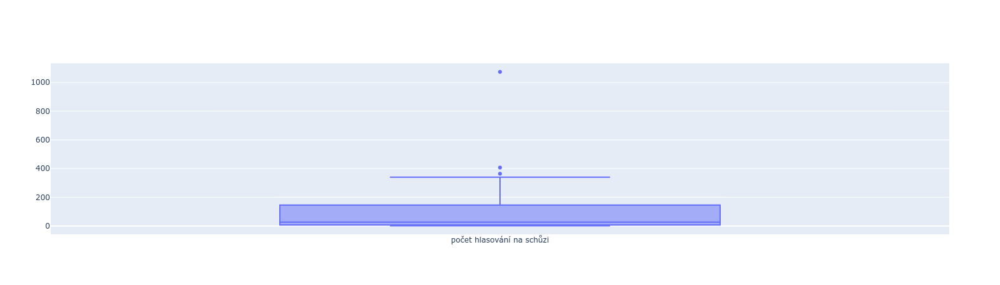

In [13]:
go.Figure(go.Box(y=hlasovani_df.groupby("schuze").size(), name="počet hlasování na schůzi"))

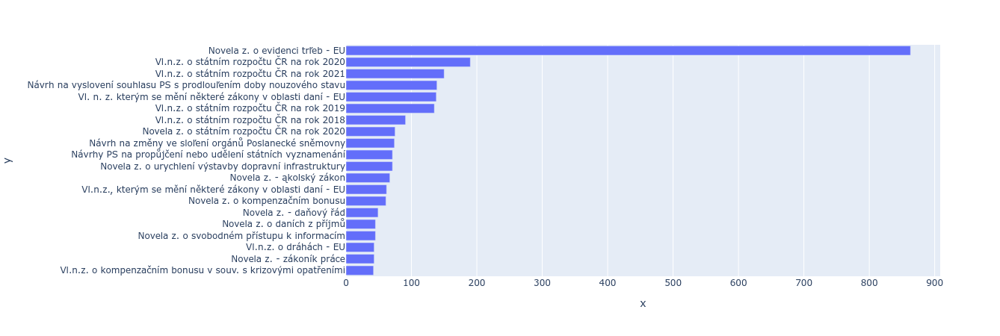

In [14]:
hlasovani_dle_bodu_srs = hlasovani_df[hlasovani_df.bod >= 1].groupby("nazev_dlouhy").size().sort_values(ascending=False)
cnt = 20
y=hlasovani_dle_bodu_srs[:cnt].index[::-1]
x=hlasovani_dle_bodu_srs[:cnt].values[::-1]
px.bar(x=x, y=y, orientation='h')

In [15]:
def pocet_dni_na_schuzi(id_schuze):
    return len(hlasovani_df[hlasovani_df.schuze == id_schuze].groupby('datum').size().index)

cnt = 10
schuze_dle_poctu_hlasovani = hlasovani_df.groupby("schuze").count().id_hlasovani.sort_values(ascending=False)
schuze_dle_poctu_hlasovani_str = [f"Během {schuze}. schůze ({pocet_dni_na_schuzi(schuze)} dní) proběhlo {pocet_hlasovani} hlasování, průměrně {pocet_hlasovani/pocet_dni_na_schuzi(schuze):.0f} hlasování za den." 
    for (schuze, pocet_hlasovani) in schuze_dle_poctu_hlasovani.iteritems()]
x = "\n".join(schuze_dle_poctu_hlasovani_str[:cnt])

print(f"Prvních {cnt} schůzí s největším počtem hlasování:\n{x}")

Prvních 10 schůzí s největším počtem hlasování:
Během 30. schůze (12 dní) proběhlo 1074 hlasování, průměrně 90 hlasování za den.
Během 39. schůze (10 dní) proběhlo 407 hlasování, průměrně 41 hlasování za den.
Během 35. schůze (11 dní) proběhlo 364 hlasování, průměrně 33 hlasování za den.
Během 72. schůze (8 dní) proběhlo 340 hlasování, průměrně 42 hlasování za den.
Během 62. schůze (11 dní) proběhlo 340 hlasování, průměrně 31 hlasování za den.
Během 40. schůze (12 dní) proběhlo 338 hlasování, průměrně 28 hlasování za den.
Během 27. schůze (10 dní) proběhlo 334 hlasování, průměrně 33 hlasování za den.
Během 24. schůze (8 dní) proběhlo 329 hlasování, průměrně 41 hlasování za den.
Během 58. schůze (7 dní) proběhlo 314 hlasování, průměrně 45 hlasování za den.
Během 49. schůze (9 dní) proběhlo 302 hlasování, průměrně 34 hlasování za den.


In [16]:
id_schuze_s_nejvetsim_poctem_hlasovani = schuze_dle_poctu_hlasovani.index[0]
#id_schuze_s_nejvetsim_poctem_hlasovani.groupby('datum')
#pocet_dni = len(hlasovani_df[hlasovani_df.schuze == id_schuze_s_nejvetsim_poctem_hlasovani].groupby('datum').count().index)
                
print(f"Největší počet hlasování ({schuze_dle_poctu_hlasovani.iloc[0]}) proběhl během {id_schuze_s_nejvetsim_poctem_hlasovani}. schůze ({pocet_dni_na_schuzi(id_schuze_s_nejvetsim_poctem_hlasovani)} dní).")
d = hlasovani_df[(hlasovani_df.schuze == id_schuze_s_nejvetsim_poctem_hlasovani) & (hlasovani_df.bod >= 1)].groupby("nazev_dlouhy").size().sort_values(ascending=False)

d

Největší počet hlasování (1074) proběhl během 30. schůze (12 dní).


nazev_dlouhy
Novela z. o evidenci trľeb - EU                                           834
Návrhy PS na propůjčení nebo udělení státních vyznamenání                  51
Novela z. o místních poplatcích                                            18
Novela z. o léčivech                                                       12
Vyjádření nesouhlasu s postupem ruské Dumy, která chce legitimizovat v     11
Novela z. o investičních pobídkách                                         11
Vl.n.z. v souvislosti s podporou výkonu práv akcionářů - EU                 8
Fin.ztráty v souv.s předběľnou zpr.Evropské komise                          6
Novela z. o podpoře sportu                                                  6
Novela z. o zemědělství                                                     5
Novela z. o zpravodajských sluľbách ČR                                      4
Novela z. o podmín. obchod. s povol. na emise skl. plynů - EU               4
Novela z. o soudnictví ve věcech mládeľe - EU      

In [17]:
x = 100 * len(hlasovani_df[hlasovani_df.bod < 1]) / len(hlasovani_df)

print(f"{x:.2f}% z hlasování bylo procedurální nebo nemělo přiděleno číslo.")

17.49% z hlasování bylo procedurální nebo nemělo přiděleno číslo.


In [18]:
hlasovani_df[hlasovani_df.prihlaseno < hlasovani_df.kvorum]

,id_hlasovani,id_organ,schuze,cislo,bod,datum,cas,pro,proti,zdrzel,nehlasoval,prihlaseno,kvorum,druh_hlasovani,vysledek,nazev_dlouhy,nazev_kratky
1526,68545,172,22,8,1,15.11.2018,10:23,0,0,0,0,0,1,N,R,Novela z. o platu představitelů státní moci,NaN
3603,70623,172,30,951,10,18.06.2019,18:19,0,1,88,0,89,101,N,R,Novela z. o podpoře sportu,NaN
4151,71171,172,35,61,317,17.10.2019,10:35,0,0,0,0,0,1,N,R,Písemná interpelace V. Kovářové na A. Babiąe v...,NaN
4977,71997,172,40,40,209,22.01.2020,11:08,0,0,0,0,0,1,N,R,Novela z. o provozu na pozemních komunikacích,NaN
5275,72295,172,40,338,0,02.03.2020,13:14,0,0,0,0,0,1,N,R,,NaN
7147,74167,172,62,165,0,26.10.2020,08:45,0,0,0,0,0,1,N,R,,NaN


In [19]:
hlasovani_df.groupby('druh_hlasovani').size()

druh_hlasovani
N    8091
dtype: int64

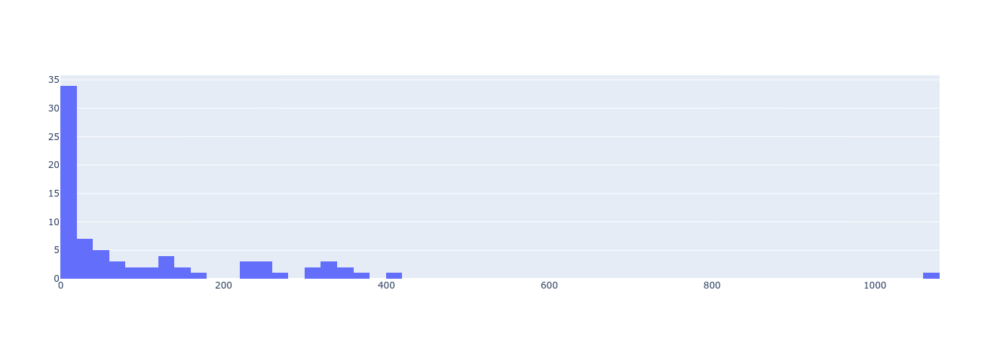

In [20]:
# Počet hlasování na schůzi

s = hlasovani_df.groupby('schuze').size().sort_values()
y = s.index
x = s

go.Figure(go.Histogram(x=x, nbinsx=60))

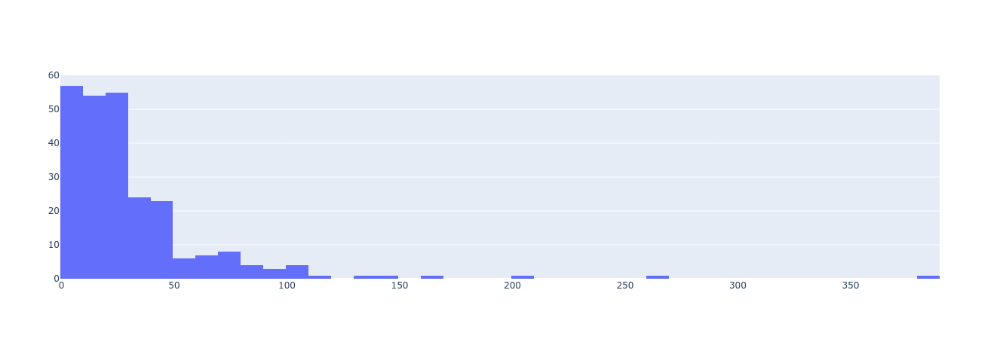

In [21]:
# Počet hlasování na den

s = hlasovani_df.groupby('datum').size().sort_values()
y = s.index
x = s

go.Figure(go.Histogram(x=x, nbinsx=60))

Na schůzích [10, 21, 71] se nehlasovalo.


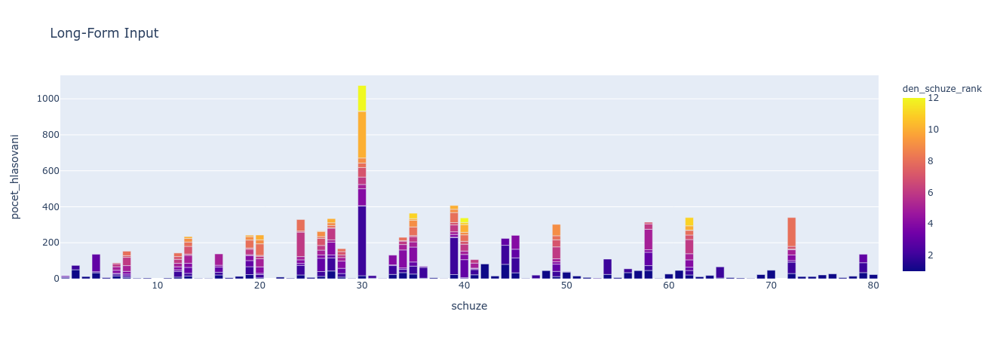

In [85]:
hlasovani_df["pocet_dni_na_schuzi"] = hlasovani_df.groupby(["schuze"]).datum.transform('nunique')

hlasovani_df["den_schuze"] = hlasovani_df.groupby(["schuze", "datum"]).ngroup()
hlasovani_df["den_schuze_min"] = hlasovani_df.groupby(["schuze"]).den_schuze.transform(min)
hlasovani_df["den_schuze_rank"] = (hlasovani_df["den_schuze"] - hlasovani_df["den_schuze_min"] + 1)

x1 = hlasovani_df.groupby(["schuze", "datum", "den_schuze_rank"]).size()
z1 = x1.reset_index(name="pocet_hlasovani")
z2 = x1.reset_index(name="pocet_hlasovani").set_index("datum")

print(f"Na schůzích {sorted(set(range(z2.schuze.max() + 1)) - set(z2.schuze.unique()) - set([0]))} se nehlasovalo.")
px.bar(z1, x="schuze", y="pocet_hlasovani", color="den_schuze_rank", title="Long-Form Input")

In [1054]:
print(f"Poslední běh notebooku: {datetime.now().strftime('%d.%m.%Y %H:%M:%S')}.")

Poslední běh notebooku: 26.01.2021 09:58:22.
